this notebook best viewed by launching jupyter so you can collapse cells with figures

<a id='home'></a>
### purpose 

investigate the consistency of the rank of environmental importance output by Gradient Forest. Explore 'overall importance', 'accuracy importance', and 'weighted importance'

### outline

1. [extract factor importance from gradient forest training output](#extract)
    - the factor importance is stored in the gradient forest object saved to RDS after training
    - load these RDS files, convert env:importance to dataframe, sort by weighted importance

1. [compare consistency of importance rank](#compare)
    - compare the various importances by visualizing their rank
        - [compare across population sets (all pops ('full') and kfold sets)](#a)
        - [compare rank consistency for baypass and the wza outlier sets](#b)
        - [random vs outlier](#c)
        - [weighted and accuracy importance](#d)

1. [create bargraphs of importance rank, like in the gradient forests manual](#bars)


In [1]:
from pythonimports import *
from myfigs import *
import matplotlib.lines as mlines
import matplotlib.colors as mcolors

figdir = makedir(
    '/data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance'
)

t1 = dt.now()  # notebook timer

lview,dview = get_client()
latest_commit()
sinfo(html=True)

50 50
##################################################################
Today:	August 29, 2023 - 07:53:14
python version: 3.8.5
conda env: newpy385

Current commit of pythonimports:
commit 03d76f7a992130f4b94ac34a09ad439e918d3044  
Author: Brandon Lind <lind.brandon.m@gmail.com>  
Date:   Fri Jun 9 09:42:21 2023 -0400
##################################################################



<a id='extract'></a>

# 1. extract factor importance from gradient forest training output

extract both the overall importance and the weighted importance

[top](#home)

In [2]:
# get the training files
training_dir = '/data/projects/pool_seq/phenotypic_data/offset_misc_files/training/training_outfiles'
files = fs(training_dir, exclude='wl-', endswith='training.RDS')  # exclude western larch
len(files)

76

In [3]:
files[0]

'/data/projects/pool_seq/phenotypic_data/offset_misc_files/training/training_outfiles/combined-baypass-random-full_gradient_forest_training.RDS'

In [4]:
# using rpy2 in parallel used up too much memory for some reason, use a script instead:
script_dir = '/data/projects/pool_seq/phenotypic_data/offset_misc_files'
script_file = op.join(script_dir, 'extract_importance.R')

importance_script = """
#-----------------------------------------------------------------------------------------------------#
# From a saved RDS object output from gradient forest training, extract predictor importance and save
#-----------------------------------------------------------------------------------------------------#

library(gradientForest)

args = commandArgs(trailingOnly=TRUE)
rdsfile = args[1]

rds = readRDS(rdsfile)

df1 = data.frame(overall_importance=rds$overall.imp)
df2 = data.frame(weighted_importance=importance(rds, type='Weighted'))
df3 = data.frame(accuracy_importance=importance(rds, type='Accuracy'))

# combine df1 with df2
df = merge(df1, df2, by='row.names', all=TRUE)
rownames(df) = df[,'Row.names']
df = subset(df, select=-c(Row.names))

# combine df1+df2 with df3
df = merge(df, df3, by='row.names', all=TRUE)
rownames(df) = df[,'Row.names']
df = subset(df, select=-c(Row.names))

outfile <- gsub(".RDS", "_importances.txt", rdsfile)

write.table(df, outfile, sep='\t', row.names=TRUE)

print("wrote to outfile:")
print(outfile)

"""

with open(script_file, 'w') as o:
    o.write(importance_script)
    
!cat $script_file


#-----------------------------------------------------------------------------------------------------#
# From a saved RDS object output from gradient forest training, extract predictor importance and save
#-----------------------------------------------------------------------------------------------------#

library(gradientForest)

args = commandArgs(trailingOnly=TRUE)
rdsfile = args[1]

rds = readRDS(rdsfile)

df1 = data.frame(overall_importance=rds$overall.imp)
df2 = data.frame(weighted_importance=importance(rds, type='Weighted'))
df3 = data.frame(accuracy_importance=importance(rds, type='Accuracy'))

# combine df1 with df2
df = merge(df1, df2, by='row.names', all=TRUE)
rownames(df) = df[,'Row.names']
df = subset(df, select=-c(Row.names))

# combine df1+df2 with df3
df = merge(df, df3, by='row.names', all=TRUE)
rownames(df) = df[,'Row.names']
df = subset(df, select=-c(Row.names))

outfile <- gsub(".RDS", "_importances.txt", rdsfile)

write.table(df, outfile, sep='	', row.names=TRU

In [5]:
def get_importance(f):
    """Extract importance values from RDS file, save to .txt file."""
    import subprocess
    
    output = subprocess.check_output(
        [
            Rscript,
            script_file,
            f
        ]
    ).decode("utf-8").replace("\n", "").split()[-1]
    
    return output

# prep for parallelization
Rscript = '/lu213/brandon.lind/data/anaconda3/envs/r35/bin/Rscript'
dview['Rscript'] = Rscript
dview['script_file'] = script_file


# test out function
#get_importance(files[0])

In [6]:
# read in importance values in parallel
jobs = []
for f in files:
    jobs.append(
        lview.apply_async(
            get_importance, f
        )
    )
    
watch_async(jobs)


Watching 76 jobs ...


100%|███████████████| 76/76 [01:24<00:00,  1.11s/it]


In [7]:
# put parallel output into dictionary of ranks
importance_files = fs(training_dir, endswith='importances.txt')

importances = wrap_defaultdict(None, 4)
for f in pbar(importance_files):
    spp, method, setname, kfold = op.basename(f).rstrip("_gradient_forest_training_importances.txt").split('-')
    importances[spp][method][setname][kfold] = pd.read_table(f)

assert len(importance_files) == len(files)
    
importances[spp][method][setname][kfold].head()

100%|███████████████| 76/76 [00:00<00:00, 621.40it/s]


,overall_importance,weighted_importance,accuracy_importance
AHM,0.000333,0.011219,0.000333
bFFP,0.000523,0.016571,0.000523
CMD,0.000351,0.011698,0.000351
DD_0,0.001100,0.033235,0.001100
DD5,0.000845,0.028978,0.000845


<a id='compare'></a>
# 2. compare consistency

first compare ranks across kfold+full for a given outlier method

then compare 'random' vs 'outlier'  for a given method

do so for 'overall importance' and 'weighted importance' - see Ellis et al. 2012

then compare overall to weighted

[top](#home)

### first identify provenance trial and CBST envs so I can color code labels

In [8]:
# from ../08_climate_and_geographic_distance_vs_phenotypes.ipynb

# i don't ever use `cvars` but it was handy to copy/paste into notebook so I could create `cvar_colors` below

cvars = {}
# 2. the climate variables used by British Columbia's climate-based seed transfer
cvars['cbst'] = ['MAT', 'MCMT', 'TD', 'MAP', 'MSP', 'DD5', 'EMT']
# 3. climate variables of origin explaining significant variation in provinance trials for each species
cvars['doug_prov'] = ['MAT', 'AHM']
cvars['jack_prov'] = ['MAT', 'SHM', 'TD']

In [9]:
# I wanted to use colors from offset boxplots (dashed lines) to label envs in slopegraphs
    # but the contrast wasn't good enough. I'll keep CBST as the light deepskyblue.

cvar_colors = wrap_defaultdict(
    lambda : 'black',  # all other envs will have black font
    2
)

cvar_colors['jp'].update({
    # overlap between CBST and provenance trial envs
    'MAT' : 'red',
    'TD' : 'red',

    # CBST envs
    'MCMT' : 'deepskyblue',
    'MAP' : 'deepskyblue',
    'MSP' : 'deepskyblue',
    'DD5' : 'deepskyblue',
    'EMT' : 'deepskyblue',
    
    # provenance trial envs
    'SHM' : 'saddlebrown'
})

for spp in ['fdi', 'fdc', 'combined']:
    cvar_colors[spp].update({
        # overlap between CBST and provenance trial envs
        'MAT' : 'red',
        
        # CBST envs
        'MCMT' : 'deepskyblue',
        'TD' : 'deepskyblue',
        'MAP' : 'deepskyblue',
        'MSP' : 'deepskyblue',
        'DD5' : 'deepskyblue',
        'EMT' : 'deepskyblue',
        
        # provenance trial envs
        'AHM' : 'saddlebrown'
    })

cvar_colors

defaultdict(<function defaultdict.copy>,
            {'jp': defaultdict(<function __main__.<lambda>()>,
                         {'MAT': 'red',
                          'TD': 'red',
                          'MCMT': 'deepskyblue',
                          'MAP': 'deepskyblue',
                          'MSP': 'deepskyblue',
                          'DD5': 'deepskyblue',
                          'EMT': 'deepskyblue',
                          'SHM': 'saddlebrown'}),
             'fdi': defaultdict(<function __main__.<lambda>()>,
                         {'MAT': 'red',
                          'MCMT': 'deepskyblue',
                          'TD': 'deepskyblue',
                          'MAP': 'deepskyblue',
                          'MSP': 'deepskyblue',
                          'DD5': 'deepskyblue',
                          'EMT': 'deepskyblue',
                          'AHM': 'saddlebrown'}),
             'fdc': defaultdict(<function __main__.<lambda>()>,
                    

In [10]:
# envs not in dict will be colored black
pd.Series(['MAT', 'MCMT', 'TD', 'Elevation']).map(cvar_colors['jp'])

0            red
1    deepskyblue
2            red
3          black
dtype: object

In [11]:
# envs not in dict will be colored black
pd.Series(['MAT', 'MCMT', 'TD', 'Elevation']).map(cvar_colors['fdi'])

0            red
1    deepskyblue
2    deepskyblue
3          black
dtype: object

<a id='a'></a>
### compare across population sets (all pops ('full') and kfold sets)

In [12]:
def compare_across_runs(importance='overall_importance', add_full_importance=None, **kwargs):
    """Compare across env importance rank across full and k-means runs.
    
    Possible to add one final importance from the 'full' kfold with `add_full_importance`.
    """
    for spp, methoddict in importances.items():
        for method, setdict in methoddict.items():
#             for setname, setlabel in zip(['real', 'random', 'pseudo_random_loci'], ['outliers', 'random', 'psuedo']):  # before revision
            for setname, setlabel in zip(['real', 'random'], ['outliers', 'random']):  # after revision
                imptitle = f' - {importance}' if add_full_importance is None else ''
                title = f'{spp} {method} {setlabel}{imptitle}'

                dicts = []
                labels = ['full']
                for kfold in setdict[setname].keys():
                    if kfold != 'full':
                        dicts.append(setdict[setname][kfold][importance])
                        labels.append(kfold)

                file = op.join(figdir, f'{spp}_{method}_{setlabel}_{importance}_slopegraph.pdf')
                if add_full_importance is not None:
                    dicts.append(setdict[setname]['full'][add_full_importance])
                    labels.append(None)
                    file = file.replace('_slopegraph.pdf', f'_{add_full_importance}_slopegraph.pdf')
                    # handle cases where number of k-fold different between data types
                    kwargs['markers'] = kwargs['markers'][:len(dicts)] + [kwargs['markers'][-1]]
                    kwargs['colors'] = list(mcolors.TABLEAU_COLORS)[:len(dicts)] + ['tab:brown']

                print(ColorText(title).bold())
                slope_graph(setdict[setname]['full'][importance],
                            *dicts,
                            labels=labels,
                            figsize=(5,8),
                            title=title,
                            saveloc=file,
                            labeldict=cvar_colors[spp],
                            **kwargs)
                plt.show()
    pass

combined baypass outliers - overall_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/combined_baypass_outliers_overall_importance_slopegraph.pdf


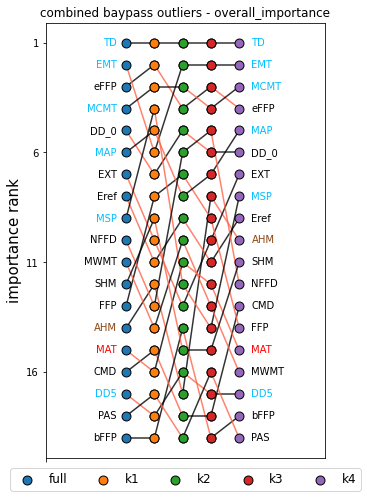

combined baypass random - overall_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/combined_baypass_random_overall_importance_slopegraph.pdf


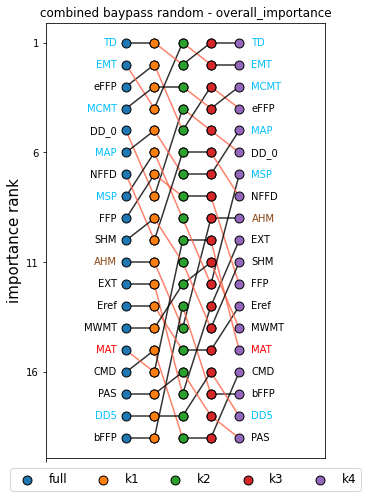

combined wza outliers - overall_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/combined_wza_outliers_overall_importance_slopegraph.pdf


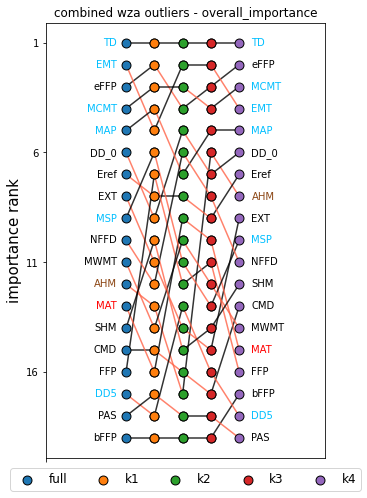

combined wza random - overall_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/combined_wza_random_overall_importance_slopegraph.pdf


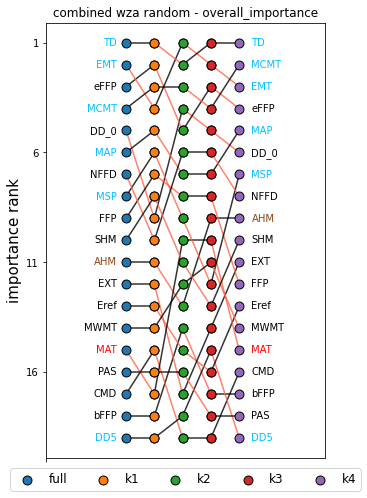

fdc baypass outliers - overall_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdc_baypass_outliers_overall_importance_slopegraph.pdf


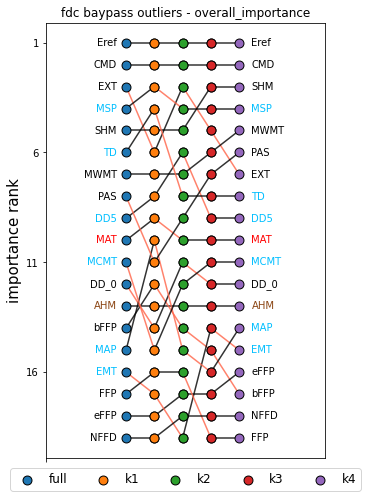

fdc baypass random - overall_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdc_baypass_random_overall_importance_slopegraph.pdf


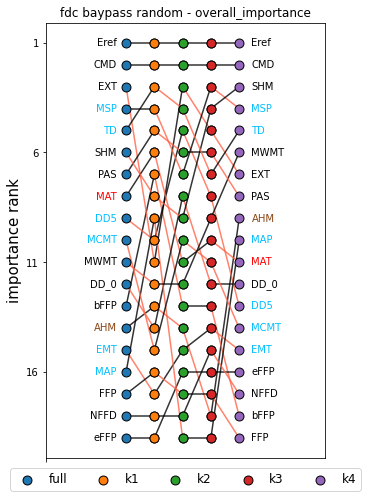

fdc wza outliers - overall_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdc_wza_outliers_overall_importance_slopegraph.pdf


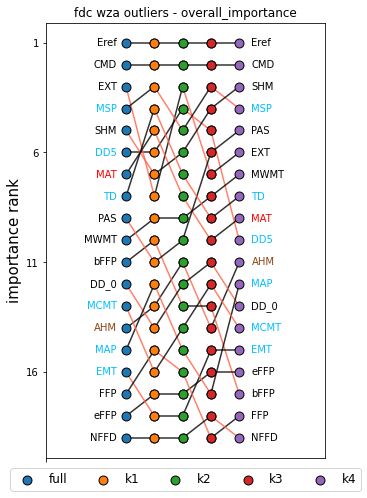

fdc wza random - overall_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdc_wza_random_overall_importance_slopegraph.pdf


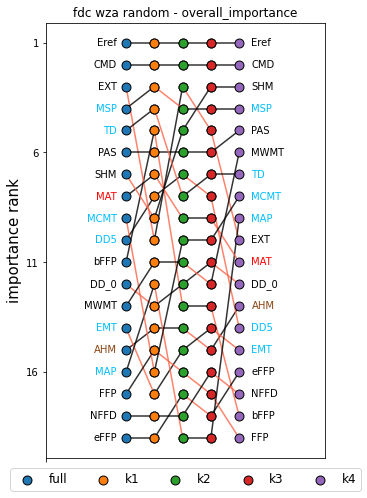

fdi baypass outliers - overall_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdi_baypass_outliers_overall_importance_slopegraph.pdf


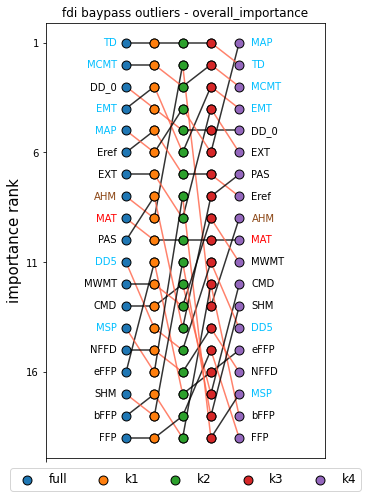

fdi baypass random - overall_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdi_baypass_random_overall_importance_slopegraph.pdf


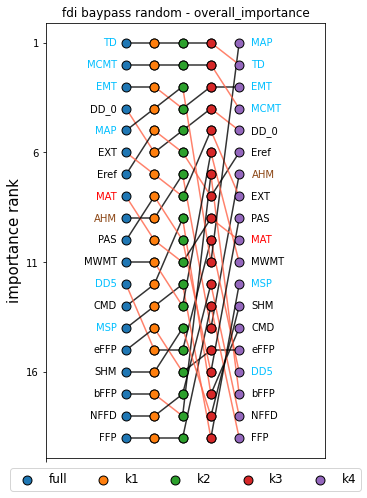

fdi wza outliers - overall_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdi_wza_outliers_overall_importance_slopegraph.pdf


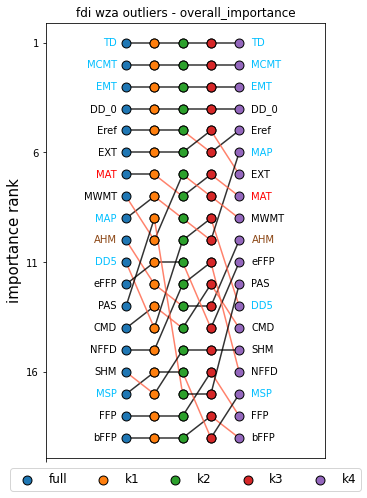

fdi wza random - overall_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdi_wza_random_overall_importance_slopegraph.pdf


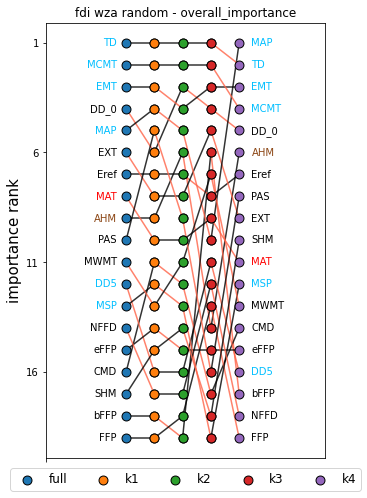

jp baypass outliers - overall_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/jp_baypass_outliers_overall_importance_slopegraph.pdf


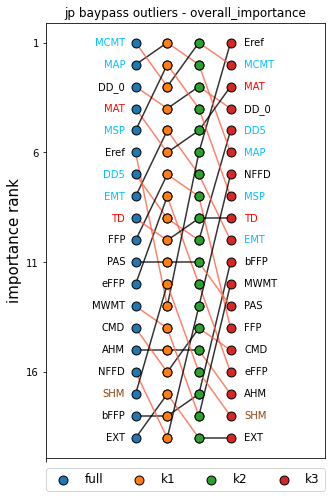

jp baypass random - overall_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/jp_baypass_random_overall_importance_slopegraph.pdf


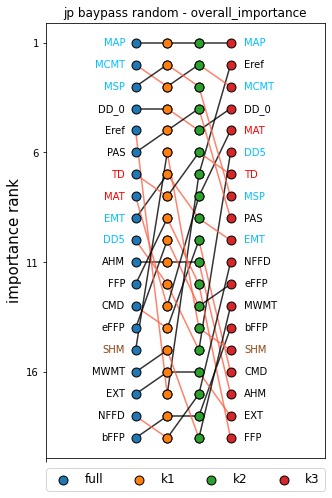

jp wza outliers - overall_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/jp_wza_outliers_overall_importance_slopegraph.pdf


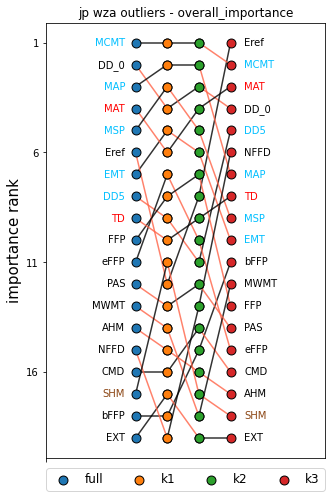

jp wza random - overall_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/jp_wza_random_overall_importance_slopegraph.pdf


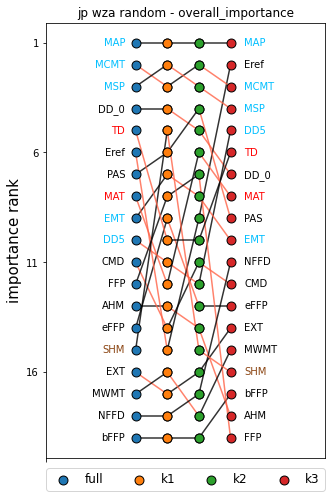

In [13]:
compare_across_runs(importance='overall_importance')

combined baypass outliers - accuracy_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/combined_baypass_outliers_accuracy_importance_slopegraph.pdf


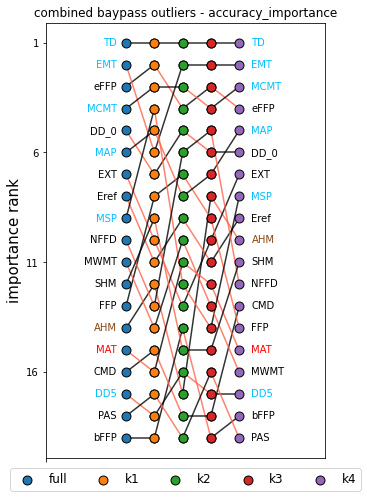

combined baypass random - accuracy_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/combined_baypass_random_accuracy_importance_slopegraph.pdf


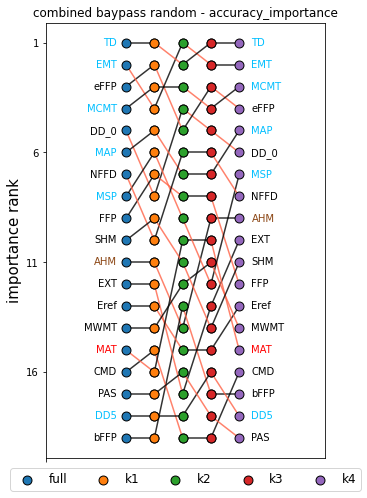

combined wza outliers - accuracy_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/combined_wza_outliers_accuracy_importance_slopegraph.pdf


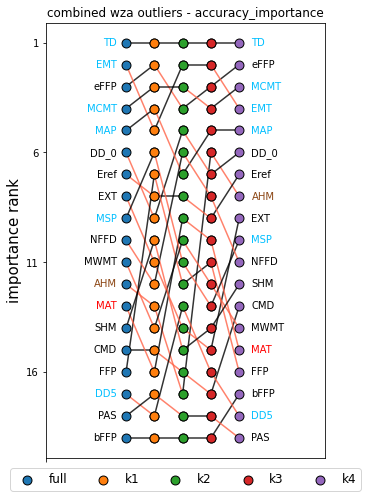

combined wza random - accuracy_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/combined_wza_random_accuracy_importance_slopegraph.pdf


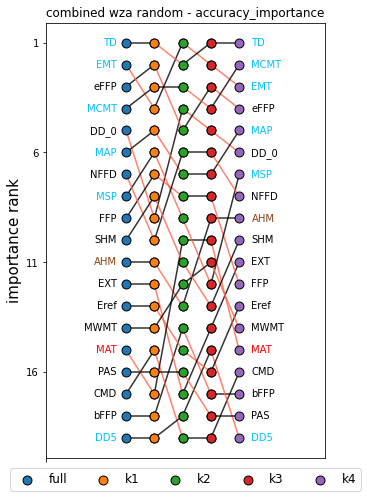

fdc baypass outliers - accuracy_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdc_baypass_outliers_accuracy_importance_slopegraph.pdf


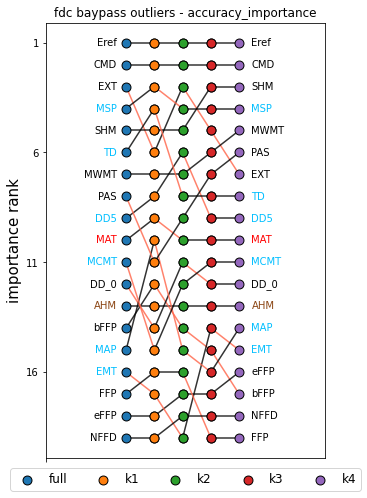

fdc baypass random - accuracy_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdc_baypass_random_accuracy_importance_slopegraph.pdf


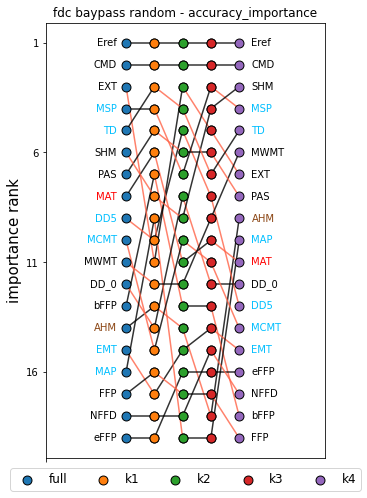

fdc wza outliers - accuracy_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdc_wza_outliers_accuracy_importance_slopegraph.pdf


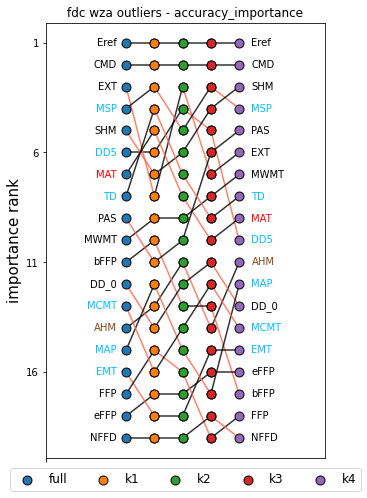

fdc wza random - accuracy_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdc_wza_random_accuracy_importance_slopegraph.pdf


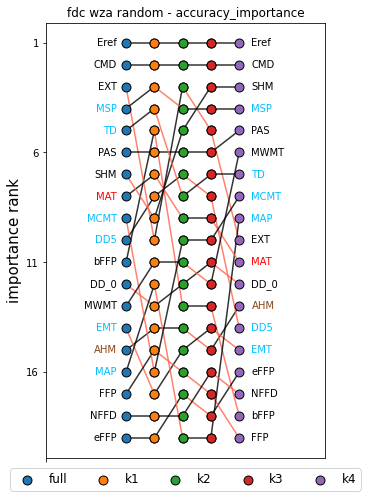

fdi baypass outliers - accuracy_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdi_baypass_outliers_accuracy_importance_slopegraph.pdf


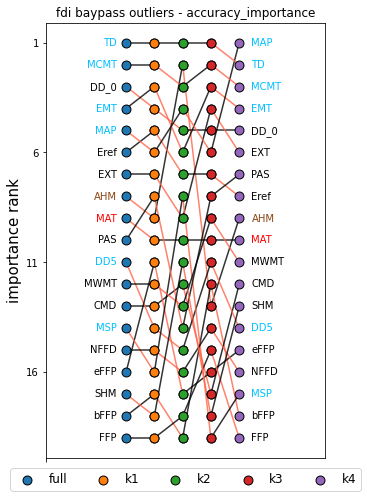

fdi baypass random - accuracy_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdi_baypass_random_accuracy_importance_slopegraph.pdf


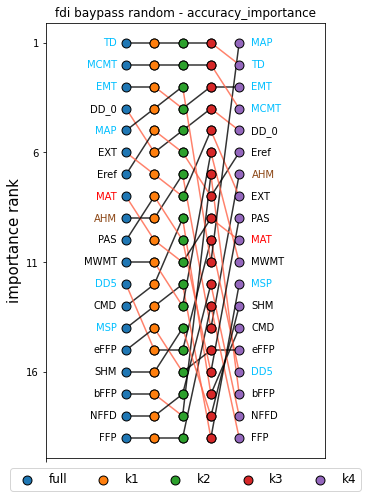

fdi wza outliers - accuracy_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdi_wza_outliers_accuracy_importance_slopegraph.pdf


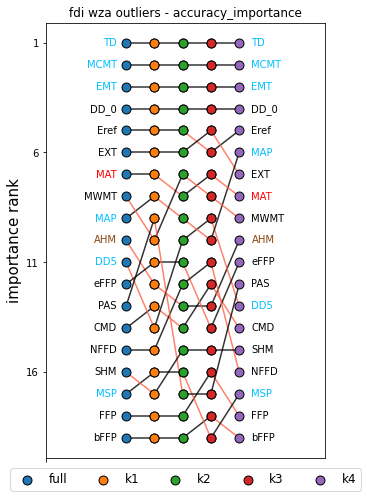

fdi wza random - accuracy_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdi_wza_random_accuracy_importance_slopegraph.pdf


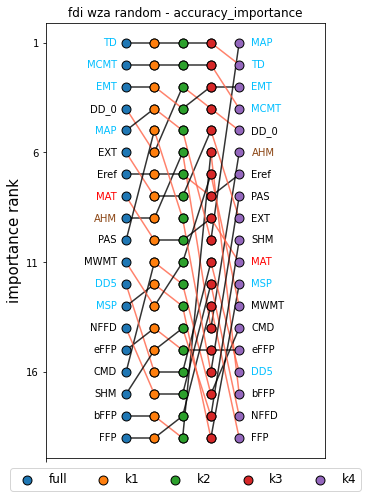

jp baypass outliers - accuracy_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/jp_baypass_outliers_accuracy_importance_slopegraph.pdf


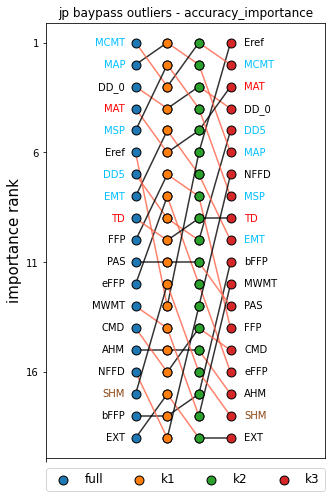

jp baypass random - accuracy_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/jp_baypass_random_accuracy_importance_slopegraph.pdf


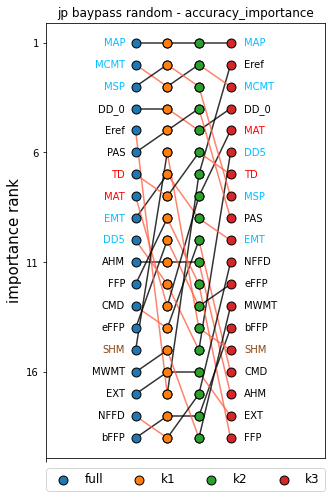

jp wza outliers - accuracy_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/jp_wza_outliers_accuracy_importance_slopegraph.pdf


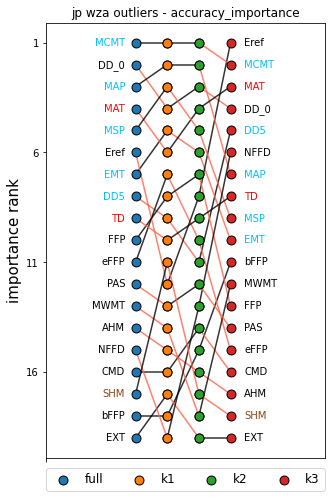

jp wza random - accuracy_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/jp_wza_random_accuracy_importance_slopegraph.pdf


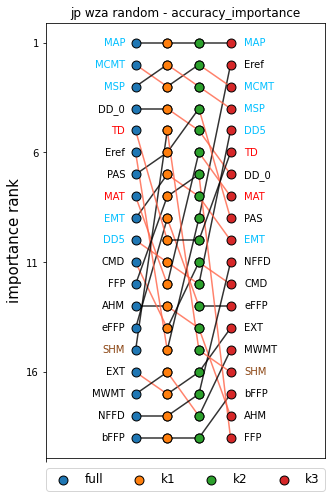

In [14]:
compare_across_runs(importance='accuracy_importance')

combined baypass outliers - weighted_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/combined_baypass_outliers_weighted_importance_slopegraph.pdf


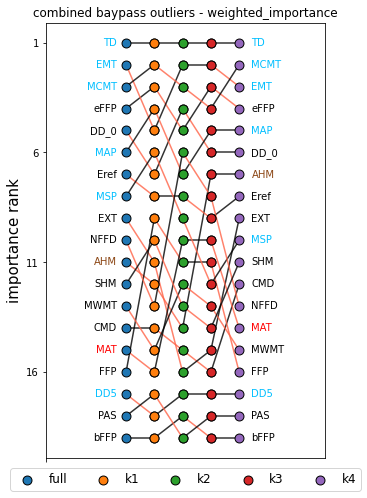

combined baypass random - weighted_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/combined_baypass_random_weighted_importance_slopegraph.pdf


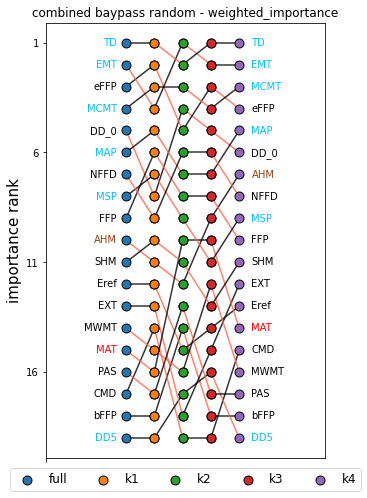

combined wza outliers - weighted_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/combined_wza_outliers_weighted_importance_slopegraph.pdf


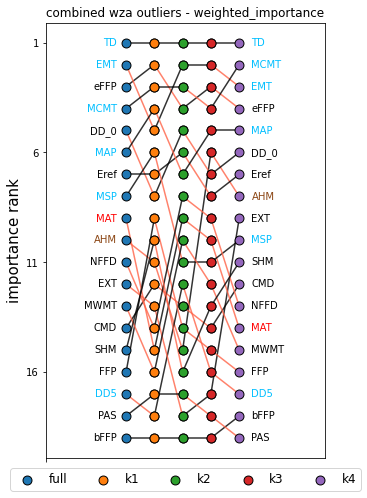

combined wza random - weighted_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/combined_wza_random_weighted_importance_slopegraph.pdf


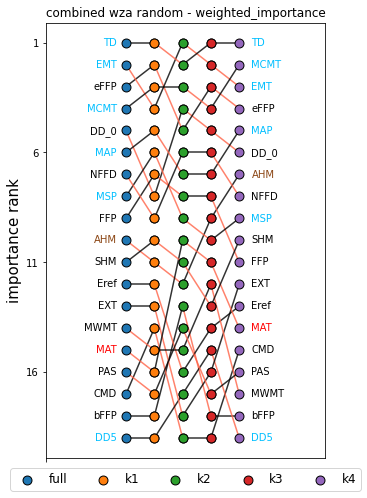

fdc baypass outliers - weighted_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdc_baypass_outliers_weighted_importance_slopegraph.pdf


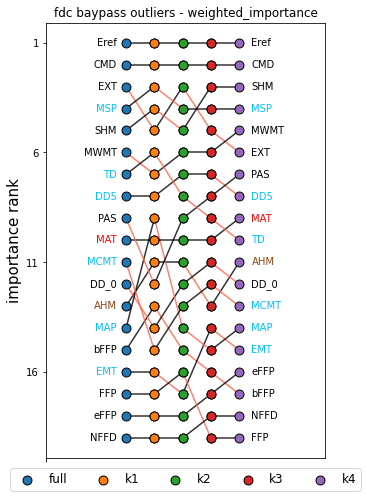

fdc baypass random - weighted_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdc_baypass_random_weighted_importance_slopegraph.pdf


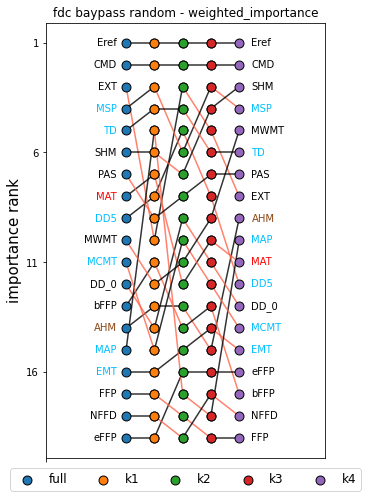

fdc wza outliers - weighted_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdc_wza_outliers_weighted_importance_slopegraph.pdf


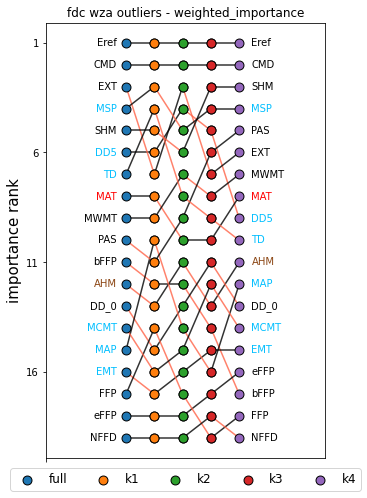

fdc wza random - weighted_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdc_wza_random_weighted_importance_slopegraph.pdf


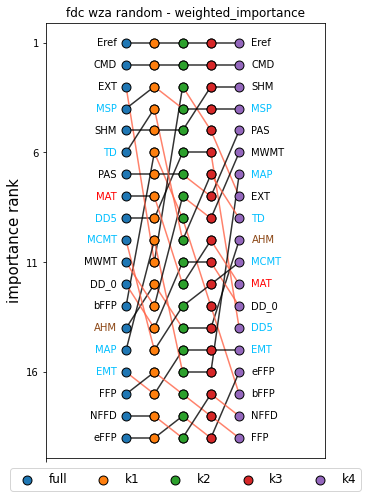

fdi baypass outliers - weighted_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdi_baypass_outliers_weighted_importance_slopegraph.pdf


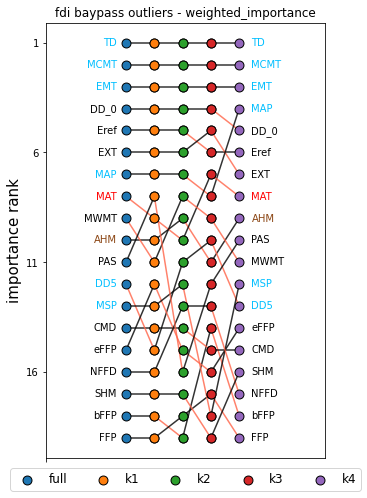

fdi baypass random - weighted_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdi_baypass_random_weighted_importance_slopegraph.pdf


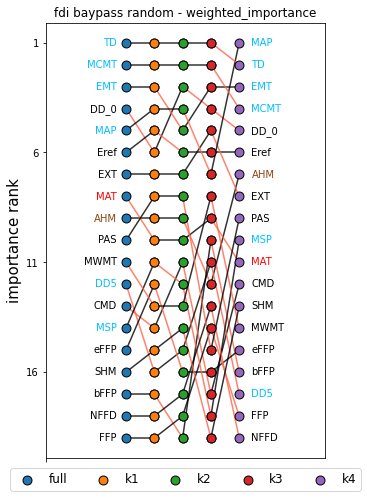

fdi wza outliers - weighted_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdi_wza_outliers_weighted_importance_slopegraph.pdf


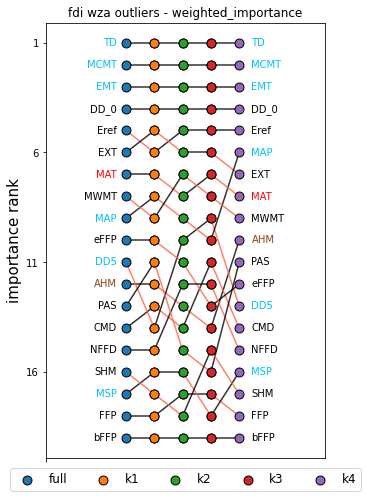

fdi wza random - weighted_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdi_wza_random_weighted_importance_slopegraph.pdf


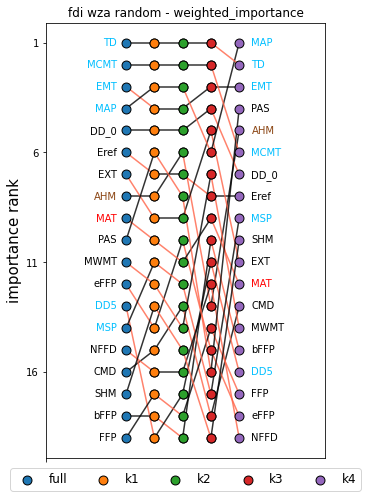

jp baypass outliers - weighted_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/jp_baypass_outliers_weighted_importance_slopegraph.pdf


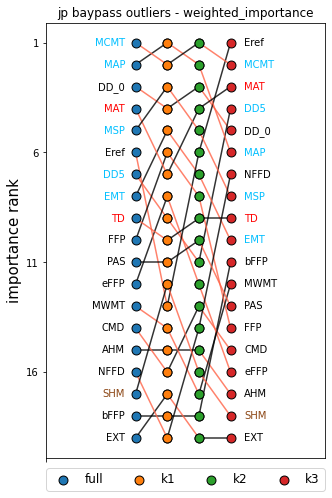

jp baypass random - weighted_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/jp_baypass_random_weighted_importance_slopegraph.pdf


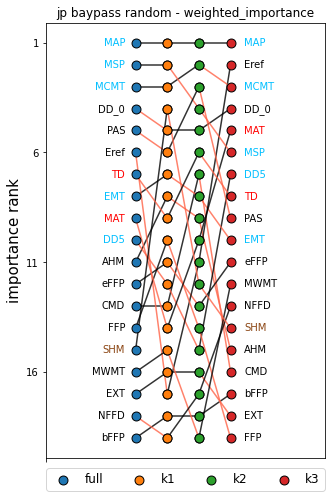

jp wza outliers - weighted_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/jp_wza_outliers_weighted_importance_slopegraph.pdf


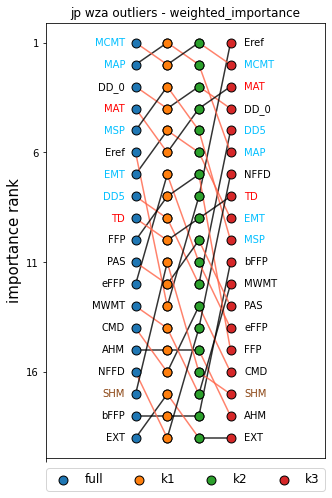

jp wza random - weighted_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/jp_wza_random_weighted_importance_slopegraph.pdf


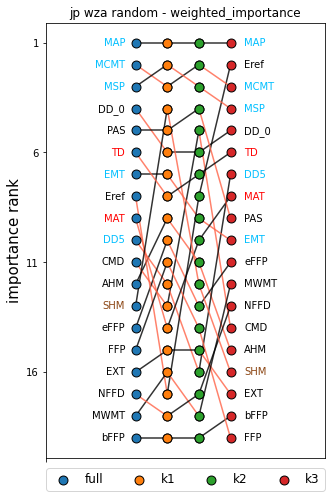

In [15]:
compare_across_runs(importance='weighted_importance')

<a id='b'></a>
### compare rank consistency for baypass and the wza outlier sets
[top](#home)

In [16]:
def compare_outlier_ranks(importance='overall_importance', shapes=['o', 'D'], shape_keys=[None, None],
                          skip_kfold=False):
    opencircle = mlines.Line2D([], [], color='None', marker=shapes[0], linestyle='None',
                               label=shape_keys[0], markeredgecolor='k')
    opendiamond = mlines.Line2D([], [], color='None', marker=shapes[1], linestyle='None',
                                label=shape_keys[1], markeredgecolor='k')

    for spp,methoddict in importances.items():
        title = f'{spp} {shape_keys[0]} and {shape_keys[1]} outliers - {importance}'
        file = f'{spp}_{importance}_{shape_keys[0]}-and-{shape_keys[1]}-outliers_slopegraph.pdf'

        dicts = []
        labels = ['full', 'full']
        if skip_kfold is False:
            for kfold in methoddict[shape_keys[0]]['real'].keys():
                if kfold != 'full':
                    dicts.append(methoddict[shape_keys[0]]['real'][kfold][importance])
                    dicts.append(methoddict[shape_keys[1]]['real'][kfold][importance])
                    labels.extend([kfold, kfold])
        else:
            file = file.replace('_slopegraph.pdf', '_nokfold_slopegraph.pdf')

        print(ColorText(title).bold())
        slope_graph(methoddict[shape_keys[0]]['real']['full'][importance],
                    methoddict[shape_keys[1]]['real']['full'][importance],
                    *dicts,
                    labels=labels,
                    figsize=(10, 8) if skip_kfold is False else (5, 8),
                    title=title,
                    labeldict=cvar_colors[spp],
                    colors=flatten(list(
                        (x,x) for x  in mcolors.TABLEAU_COLORS
                    )),
                    
                    markers=flatten(list(
                        ['o','D'] for x in mcolors.TABLEAU_COLORS
                    )),
                    
                    addtolegend=([opencircle, opendiamond],
                                 shape_keys),
                    
                    saveloc=op.join(
                        figdir,
                        file
                    ),
                    legendcols=3 if skip_kfold is True else None
                   )
        plt.show()
    pass

### accuracy_importance

combined baypass and wza outliers - accuracy_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/combined_accuracy_importance_baypass-and-wza-outliers_nokfold_slopegraph.pdf


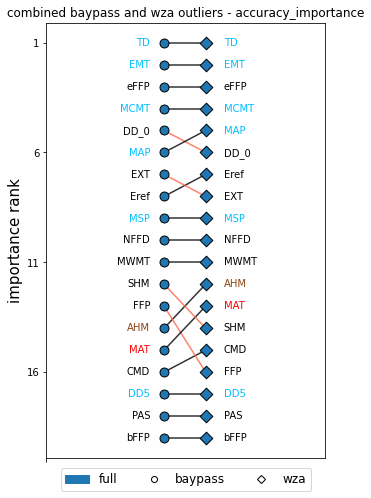

fdc baypass and wza outliers - accuracy_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdc_accuracy_importance_baypass-and-wza-outliers_nokfold_slopegraph.pdf


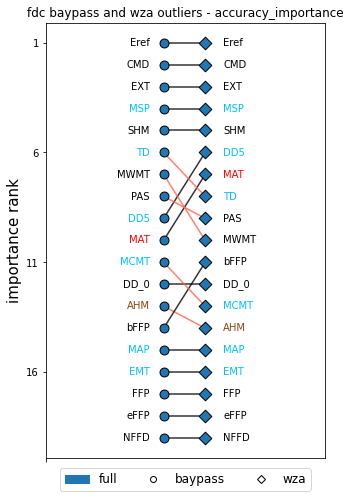

fdi baypass and wza outliers - accuracy_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdi_accuracy_importance_baypass-and-wza-outliers_nokfold_slopegraph.pdf


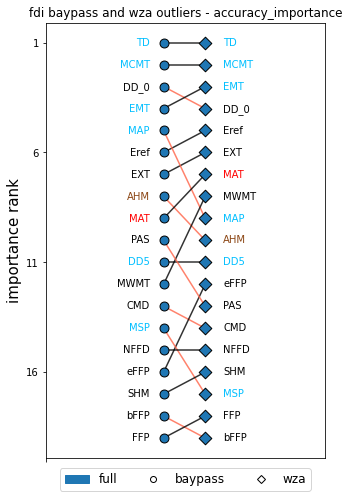

jp baypass and wza outliers - accuracy_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/jp_accuracy_importance_baypass-and-wza-outliers_nokfold_slopegraph.pdf


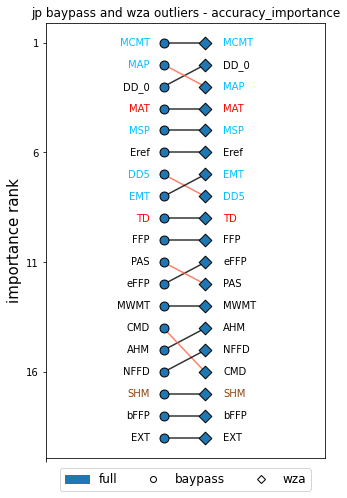

In [17]:
compare_outlier_ranks(importance='accuracy_importance', shape_keys=['baypass', 'wza'], skip_kfold=True)

combined baypass and wza outliers - accuracy_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/combined_accuracy_importance_baypass-and-wza-outliers_slopegraph.pdf


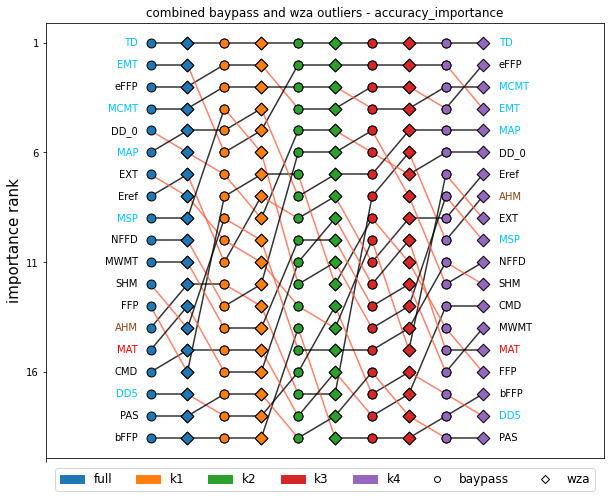

fdc baypass and wza outliers - accuracy_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdc_accuracy_importance_baypass-and-wza-outliers_slopegraph.pdf


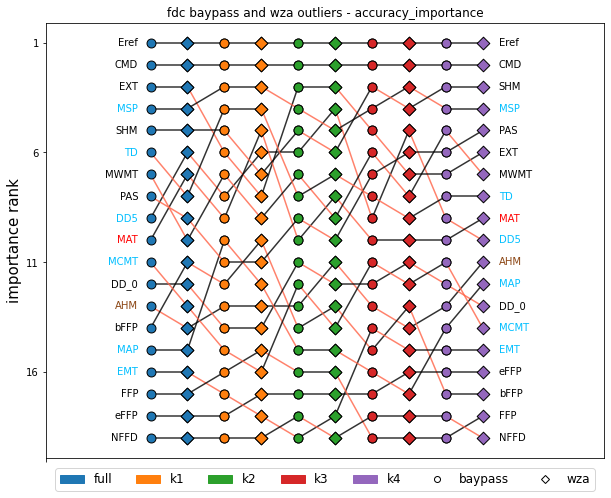

fdi baypass and wza outliers - accuracy_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdi_accuracy_importance_baypass-and-wza-outliers_slopegraph.pdf


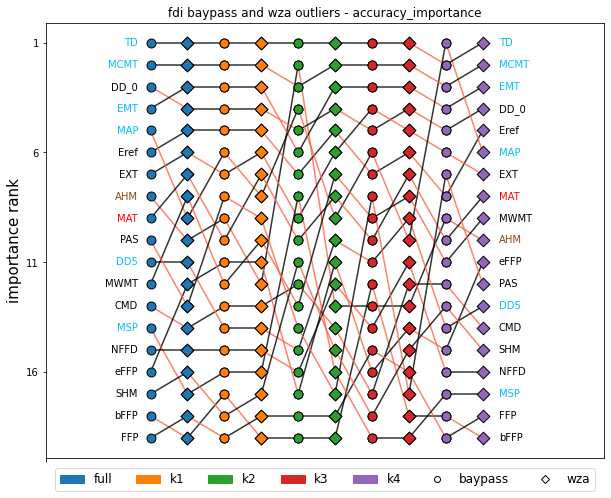

jp baypass and wza outliers - accuracy_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/jp_accuracy_importance_baypass-and-wza-outliers_slopegraph.pdf


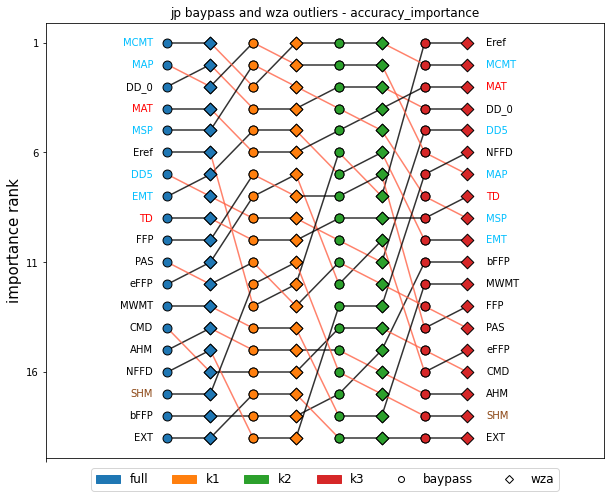

In [18]:
compare_outlier_ranks(importance='accuracy_importance', shape_keys=['baypass', 'wza'])

### overall_importance

combined baypass and wza outliers - overall_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/combined_overall_importance_baypass-and-wza-outliers_nokfold_slopegraph.pdf


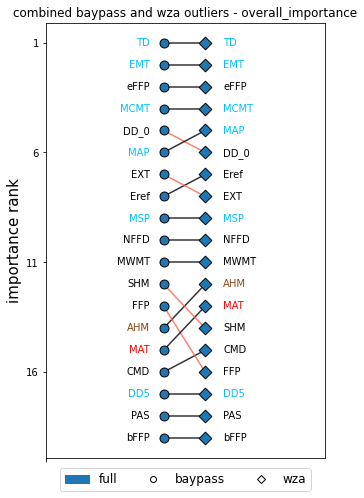

fdc baypass and wza outliers - overall_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdc_overall_importance_baypass-and-wza-outliers_nokfold_slopegraph.pdf


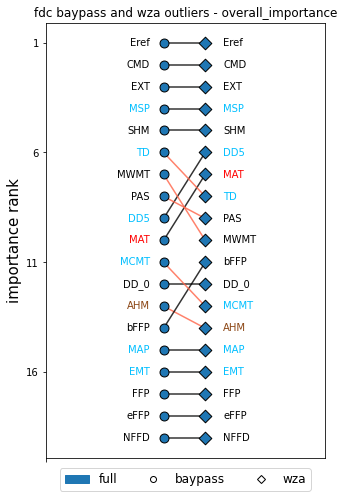

fdi baypass and wza outliers - overall_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdi_overall_importance_baypass-and-wza-outliers_nokfold_slopegraph.pdf


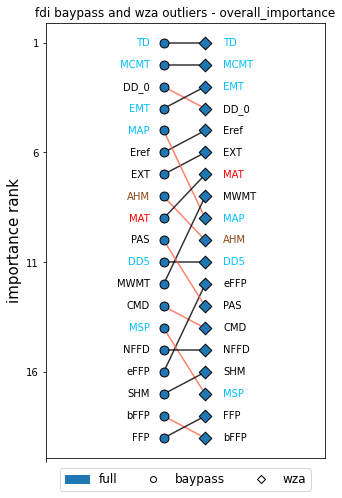

jp baypass and wza outliers - overall_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/jp_overall_importance_baypass-and-wza-outliers_nokfold_slopegraph.pdf


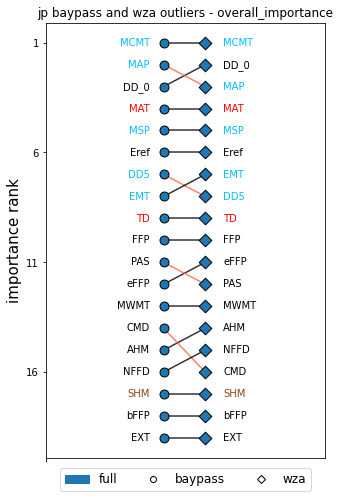

In [19]:
compare_outlier_ranks(importance='overall_importance', shape_keys=['baypass', 'wza'], skip_kfold=True)

combined baypass and wza outliers - overall_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/combined_overall_importance_baypass-and-wza-outliers_slopegraph.pdf


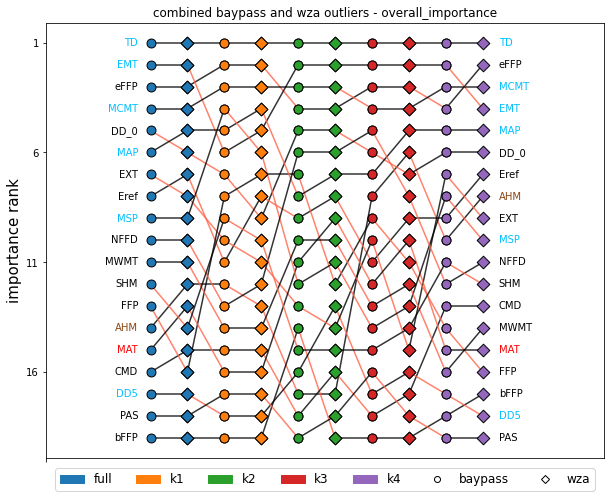

fdc baypass and wza outliers - overall_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdc_overall_importance_baypass-and-wza-outliers_slopegraph.pdf


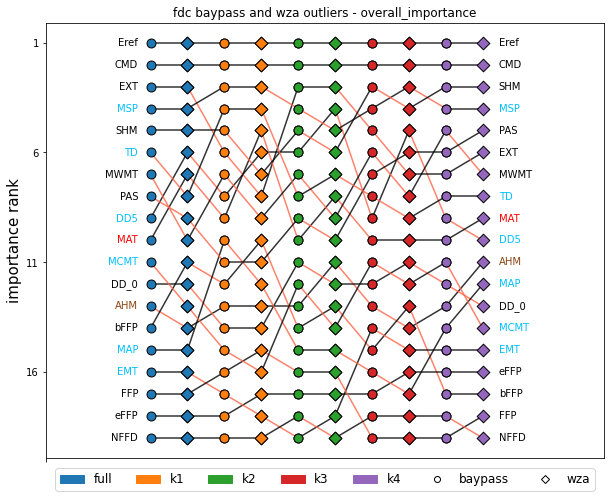

fdi baypass and wza outliers - overall_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdi_overall_importance_baypass-and-wza-outliers_slopegraph.pdf


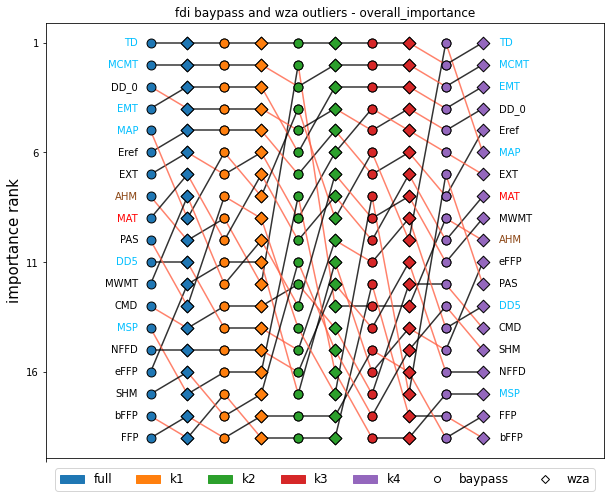

jp baypass and wza outliers - overall_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/jp_overall_importance_baypass-and-wza-outliers_slopegraph.pdf


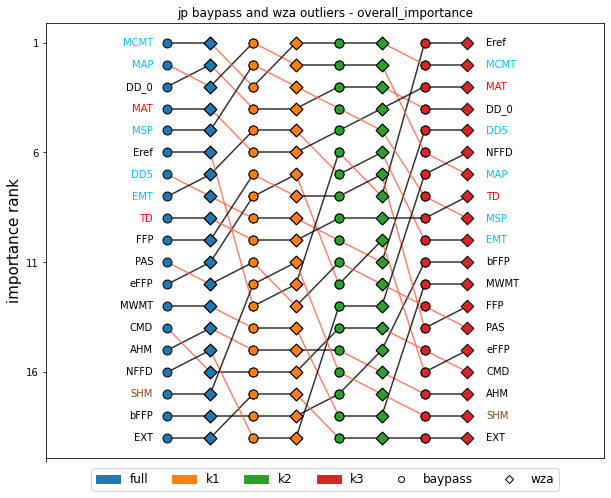

In [20]:
compare_outlier_ranks(importance='overall_importance', shape_keys=['baypass', 'wza'])

### weighted importance

combined baypass and wza outliers - weighted_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/combined_weighted_importance_baypass-and-wza-outliers_nokfold_slopegraph.pdf


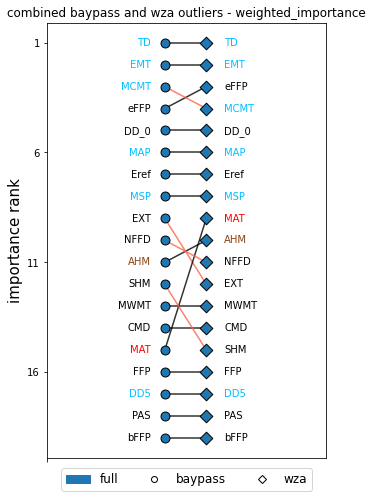

fdc baypass and wza outliers - weighted_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdc_weighted_importance_baypass-and-wza-outliers_nokfold_slopegraph.pdf


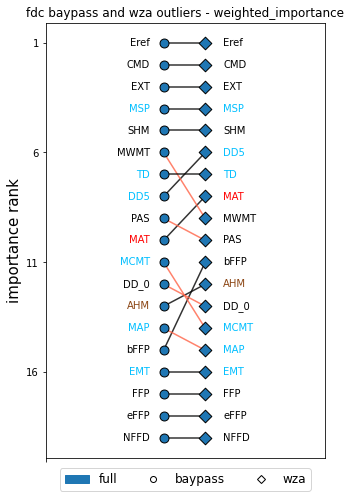

fdi baypass and wza outliers - weighted_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdi_weighted_importance_baypass-and-wza-outliers_nokfold_slopegraph.pdf


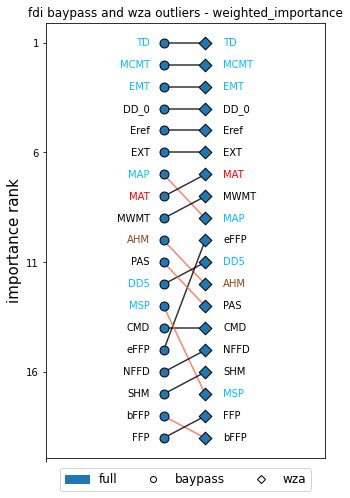

jp baypass and wza outliers - weighted_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/jp_weighted_importance_baypass-and-wza-outliers_nokfold_slopegraph.pdf


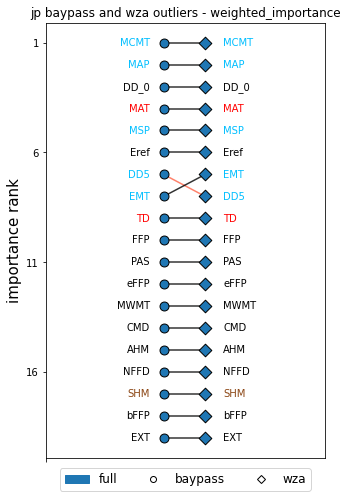

In [21]:
compare_outlier_ranks(importance='weighted_importance', shape_keys=['baypass', 'wza'], skip_kfold=True)

combined baypass and wza outliers - weighted_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/combined_weighted_importance_baypass-and-wza-outliers_slopegraph.pdf


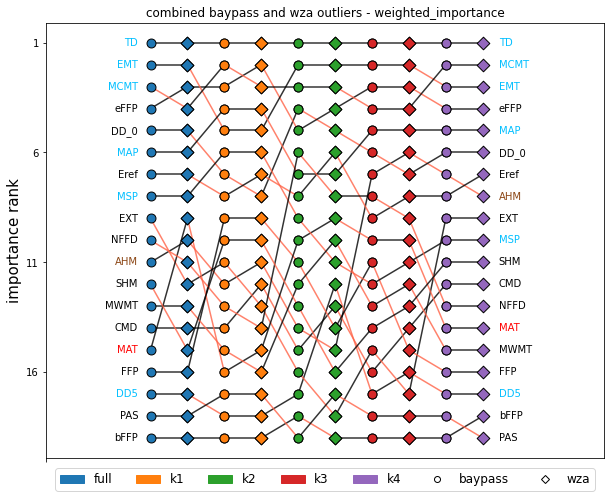

fdc baypass and wza outliers - weighted_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdc_weighted_importance_baypass-and-wza-outliers_slopegraph.pdf


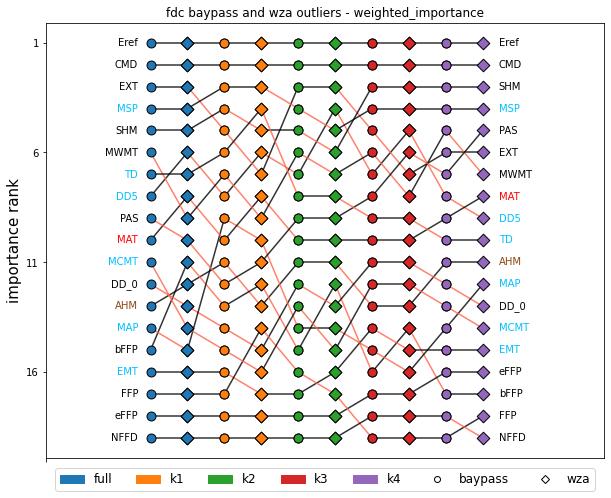

fdi baypass and wza outliers - weighted_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdi_weighted_importance_baypass-and-wza-outliers_slopegraph.pdf


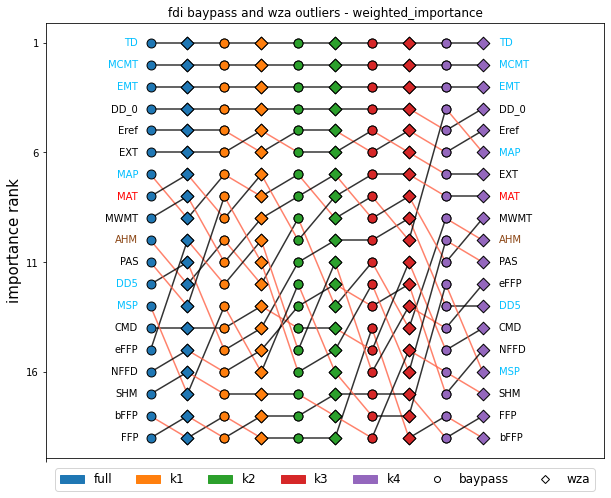

jp baypass and wza outliers - weighted_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/jp_weighted_importance_baypass-and-wza-outliers_slopegraph.pdf


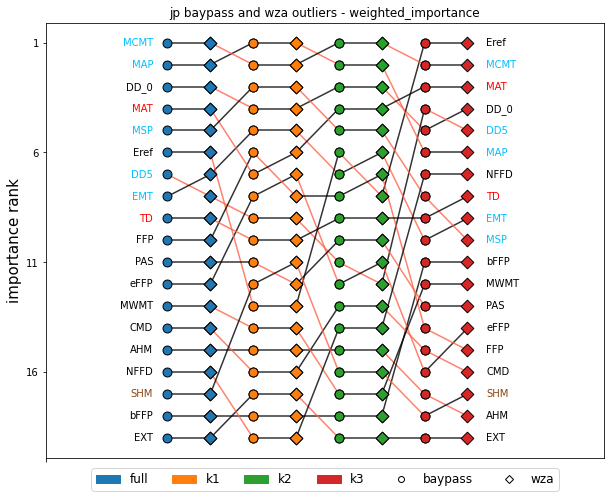

In [22]:
compare_outlier_ranks(importance='weighted_importance', shape_keys=['baypass', 'wza'])

<a id='c'></a>
### random vs outlier
[top](#home)

In [23]:
def compare_random_outlier(importance='overall_importance', shapes=['v', 'p']):
    opencircle = mlines.Line2D([],[], color='None', marker=shapes[0], linestyle='None',
                               label='outlier', markeredgecolor='k')
    opendiamond = mlines.Line2D([],[], color='None', marker=shapes[1], linestyle='None',
                                label='random', markeredgecolor='k')

    for spp,methoddict in importances.items():
        for method,setdict in methoddict.items():
            title = f'{spp} {method} outliers and random - {importance}'

            dicts = []
            labels = ['full', 'full']
            for kfold in setdict['real'].keys():
                if kfold != 'full':
                    dicts.append(setdict['real'][kfold][importance])
                    dicts.append(setdict['random'][kfold][importance])
                    labels.extend([kfold, kfold])

            print(ColorText(title).bold())
            slope_graph(setdict['real']['full'][importance],
                        setdict['random']['full'][importance],
                        *dicts,
                        labels=labels,
                        figsize=(10,8),
                        title=title,
                        labeldict=cvar_colors[spp],
                        colors=flatten(list(
                            (x,x) for x  in mcolors.TABLEAU_COLORS
                        )),
                        markers=flatten(list(
                            [shapes[0], shapes[1]] for x in mcolors.TABLEAU_COLORS
                        )),
                        addtolegend=([opencircle, opendiamond],
                                     ['outlier', 'random']),
                        saveloc=op.join(figdir, f'{spp}_{method}_{importance}_random-and-outliers_slopegraph.pdf')
                       )
            plt.show()
    pass

combined baypass outliers and random - overall_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/combined_baypass_overall_importance_random-and-outliers_slopegraph.pdf


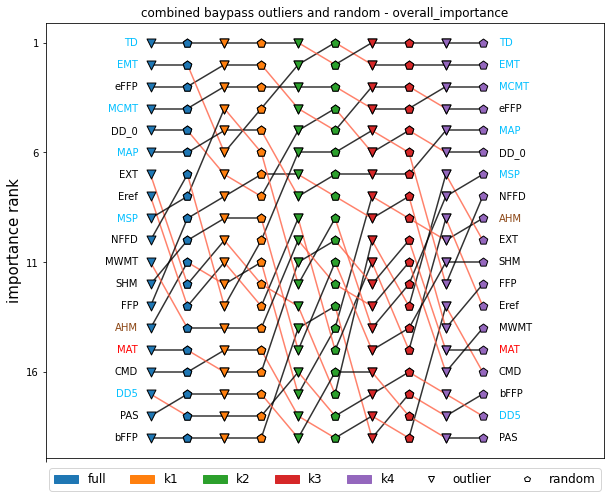

combined wza outliers and random - overall_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/combined_wza_overall_importance_random-and-outliers_slopegraph.pdf


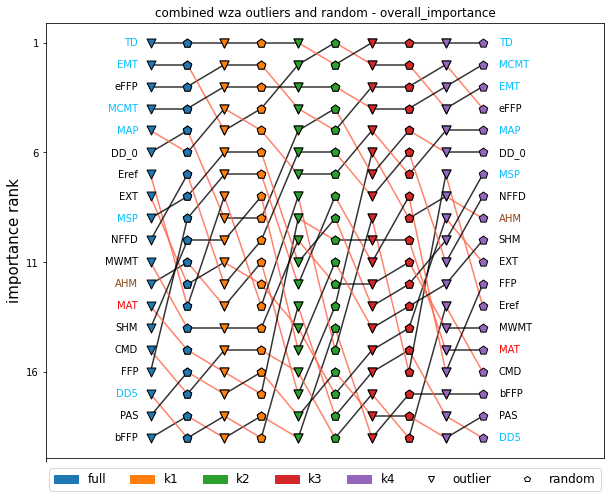

fdc baypass outliers and random - overall_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdc_baypass_overall_importance_random-and-outliers_slopegraph.pdf


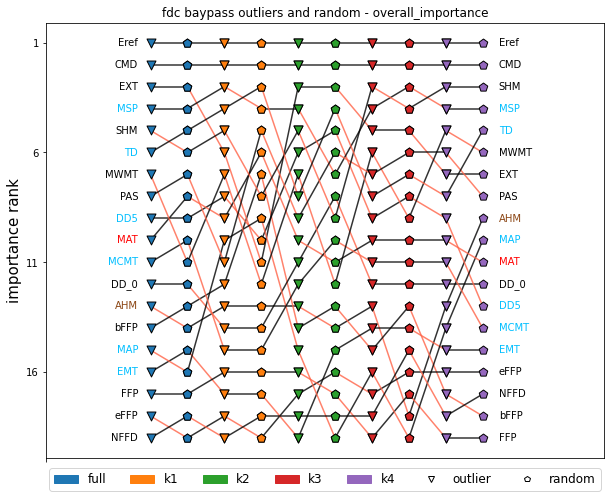

fdc wza outliers and random - overall_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdc_wza_overall_importance_random-and-outliers_slopegraph.pdf


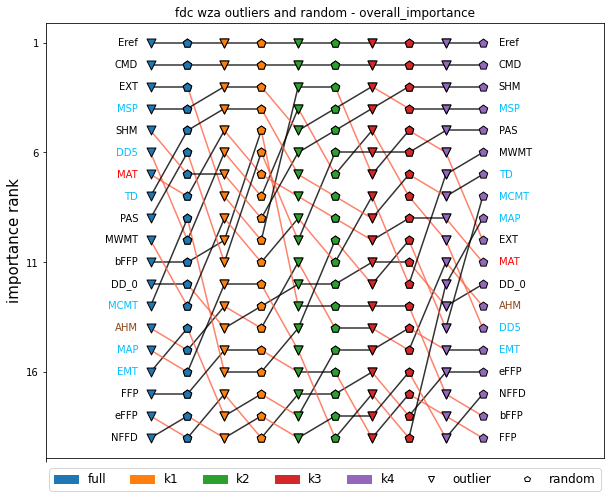

fdi baypass outliers and random - overall_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdi_baypass_overall_importance_random-and-outliers_slopegraph.pdf


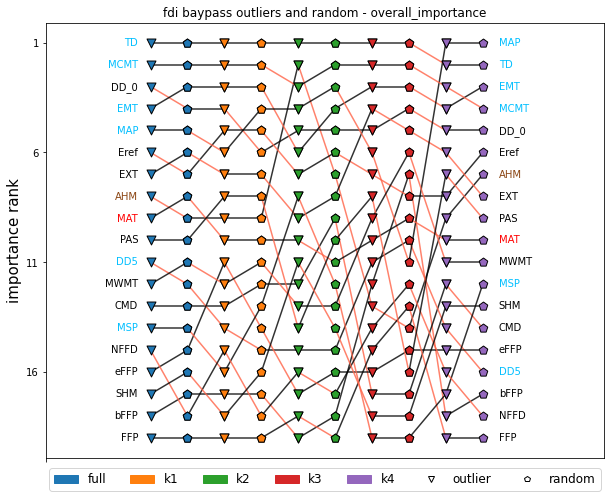

fdi wza outliers and random - overall_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdi_wza_overall_importance_random-and-outliers_slopegraph.pdf


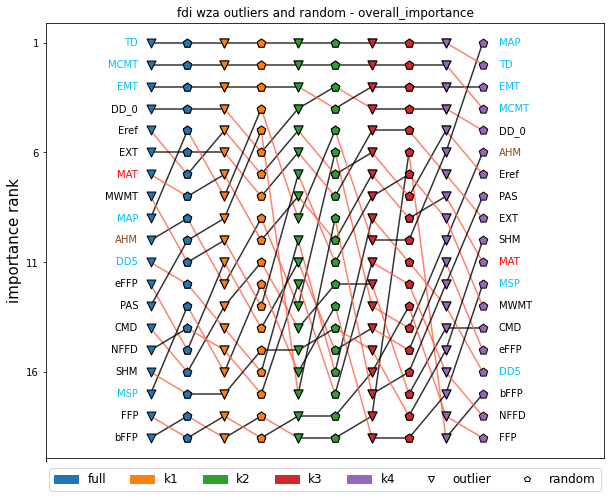

jp baypass outliers and random - overall_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/jp_baypass_overall_importance_random-and-outliers_slopegraph.pdf


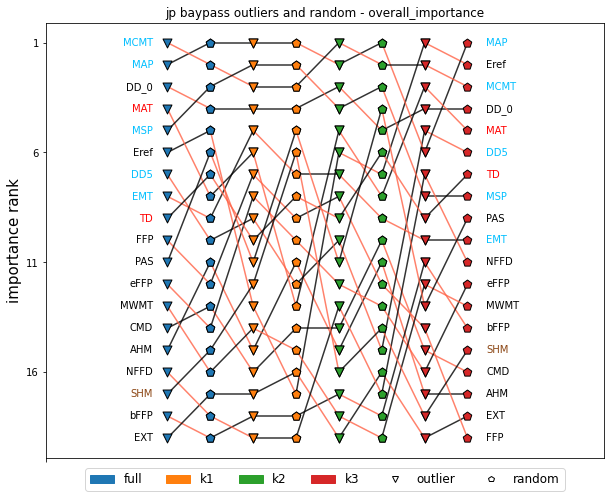

jp wza outliers and random - overall_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/jp_wza_overall_importance_random-and-outliers_slopegraph.pdf


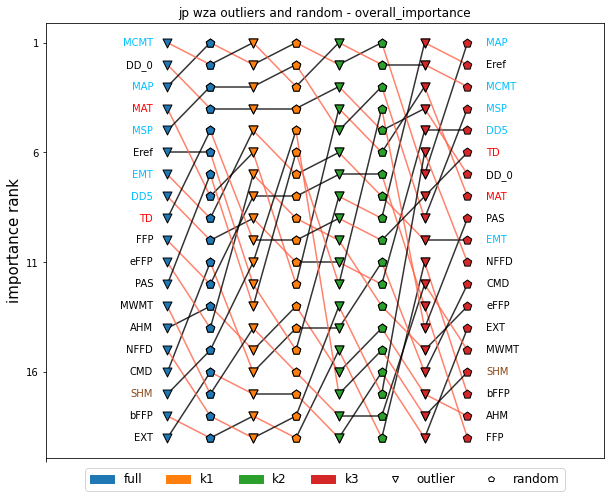

In [24]:
compare_random_outlier(importance='overall_importance')

combined baypass outliers and random - weighted_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/combined_baypass_weighted_importance_random-and-outliers_slopegraph.pdf


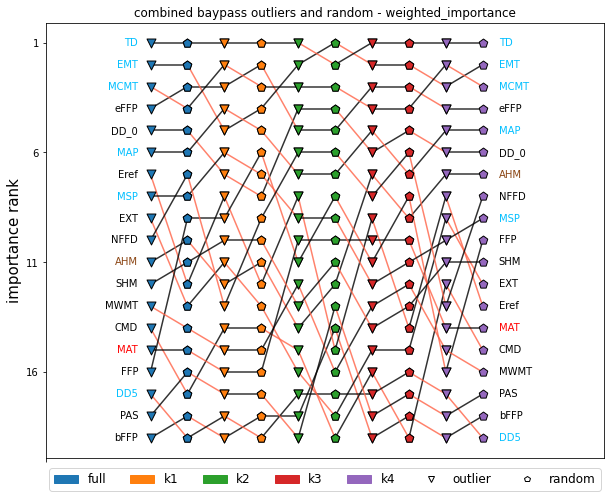

combined wza outliers and random - weighted_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/combined_wza_weighted_importance_random-and-outliers_slopegraph.pdf


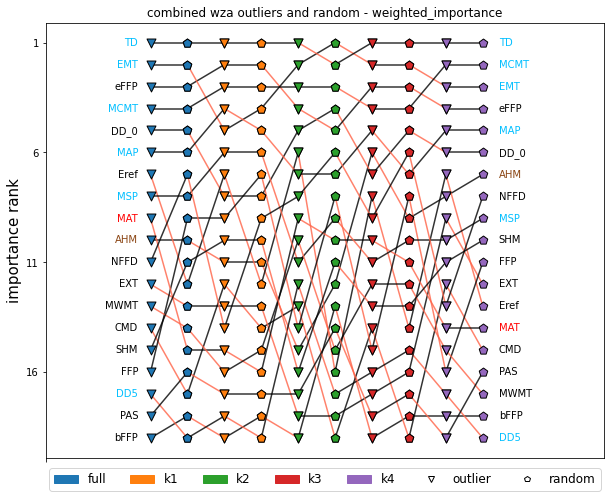

fdc baypass outliers and random - weighted_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdc_baypass_weighted_importance_random-and-outliers_slopegraph.pdf


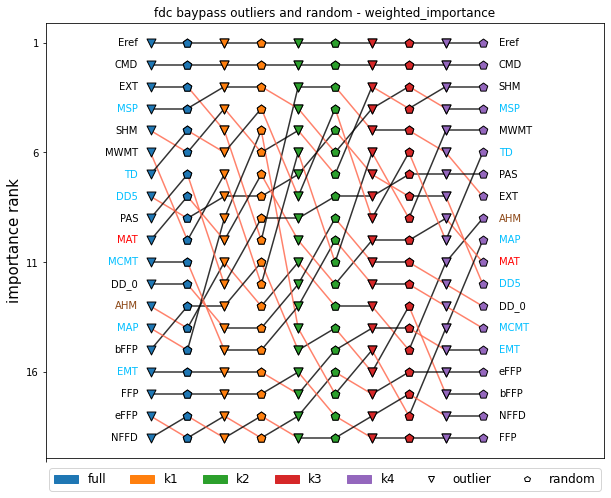

fdc wza outliers and random - weighted_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdc_wza_weighted_importance_random-and-outliers_slopegraph.pdf


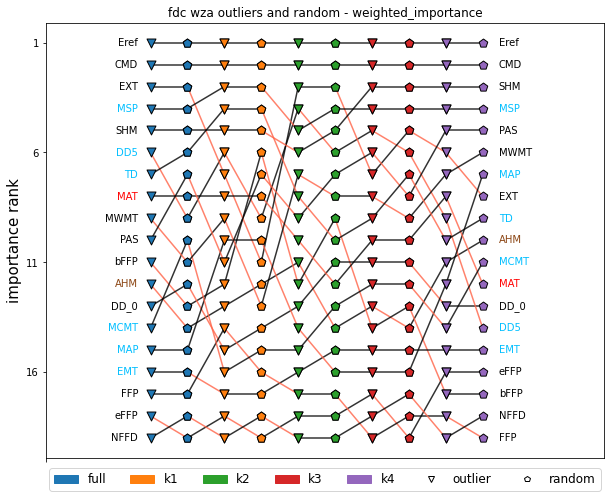

fdi baypass outliers and random - weighted_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdi_baypass_weighted_importance_random-and-outliers_slopegraph.pdf


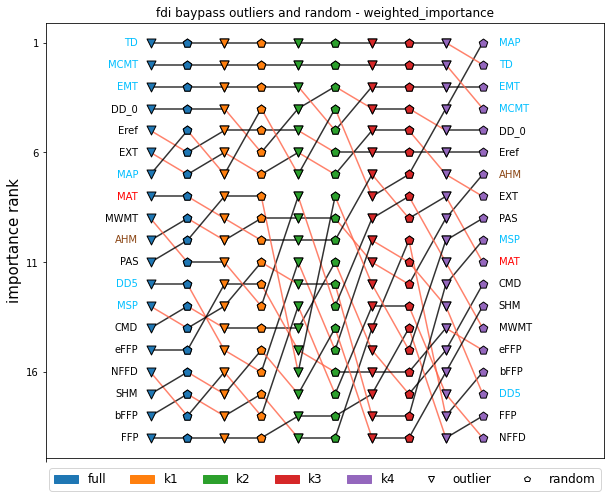

fdi wza outliers and random - weighted_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdi_wza_weighted_importance_random-and-outliers_slopegraph.pdf


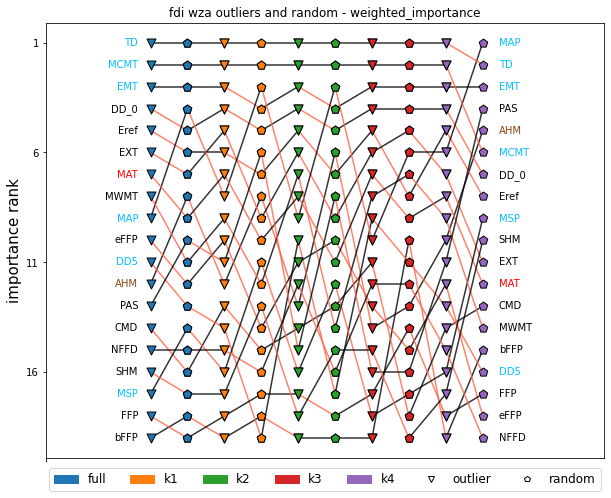

jp baypass outliers and random - weighted_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/jp_baypass_weighted_importance_random-and-outliers_slopegraph.pdf


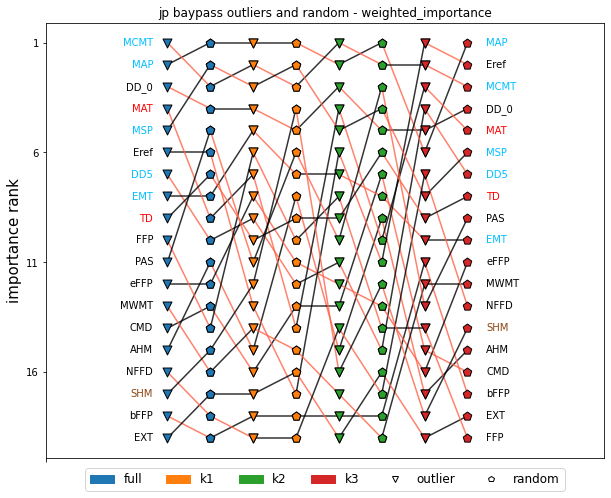

jp wza outliers and random - weighted_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/jp_wza_weighted_importance_random-and-outliers_slopegraph.pdf


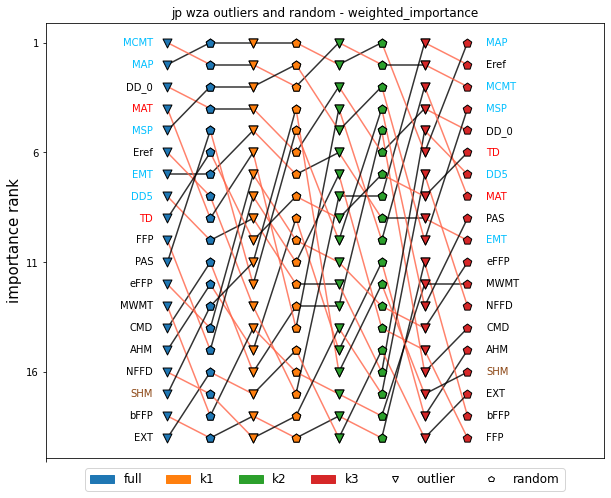

In [25]:
compare_random_outlier(importance='weighted_importance')

combined baypass outliers and random - accuracy_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/combined_baypass_accuracy_importance_random-and-outliers_slopegraph.pdf


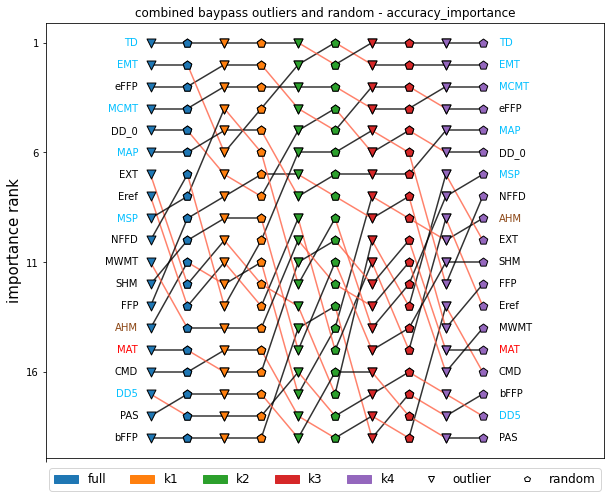

combined wza outliers and random - accuracy_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/combined_wza_accuracy_importance_random-and-outliers_slopegraph.pdf


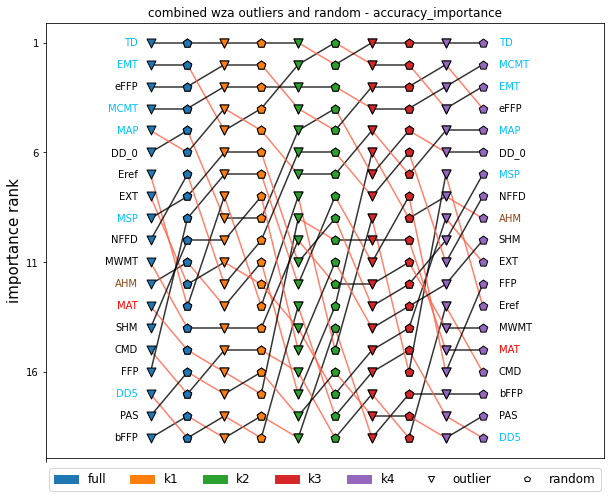

fdc baypass outliers and random - accuracy_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdc_baypass_accuracy_importance_random-and-outliers_slopegraph.pdf


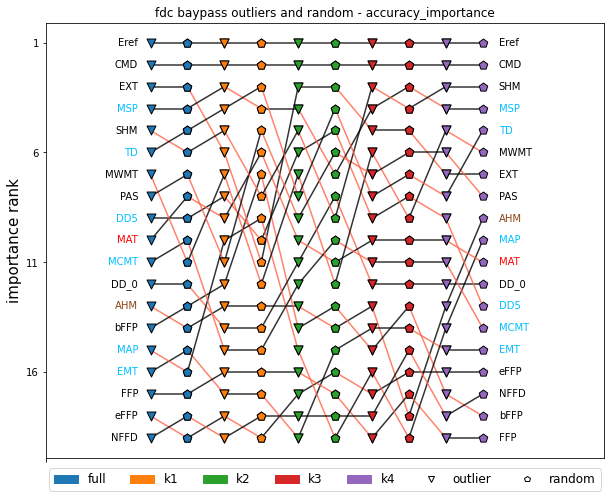

fdc wza outliers and random - accuracy_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdc_wza_accuracy_importance_random-and-outliers_slopegraph.pdf


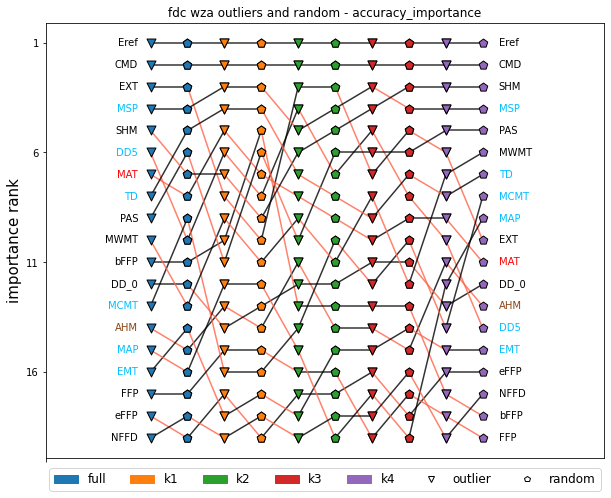

fdi baypass outliers and random - accuracy_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdi_baypass_accuracy_importance_random-and-outliers_slopegraph.pdf


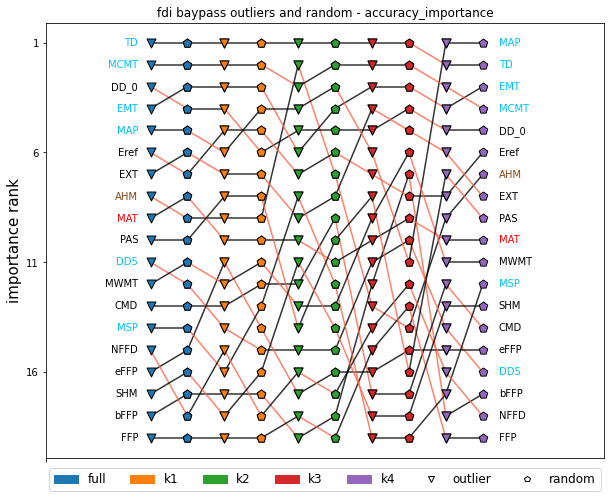

fdi wza outliers and random - accuracy_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdi_wza_accuracy_importance_random-and-outliers_slopegraph.pdf


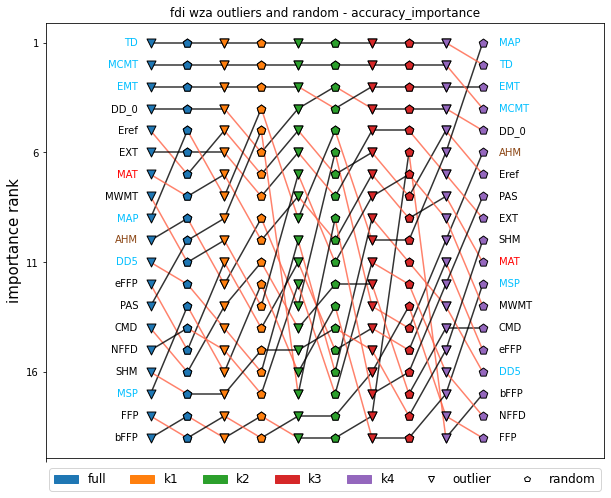

jp baypass outliers and random - accuracy_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/jp_baypass_accuracy_importance_random-and-outliers_slopegraph.pdf


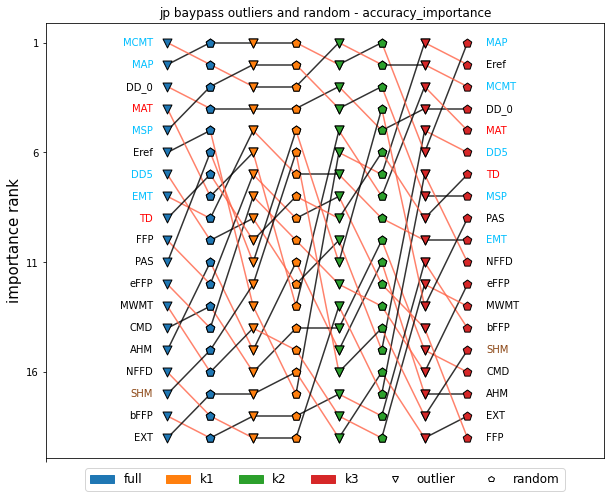

jp wza outliers and random - accuracy_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/jp_wza_accuracy_importance_random-and-outliers_slopegraph.pdf


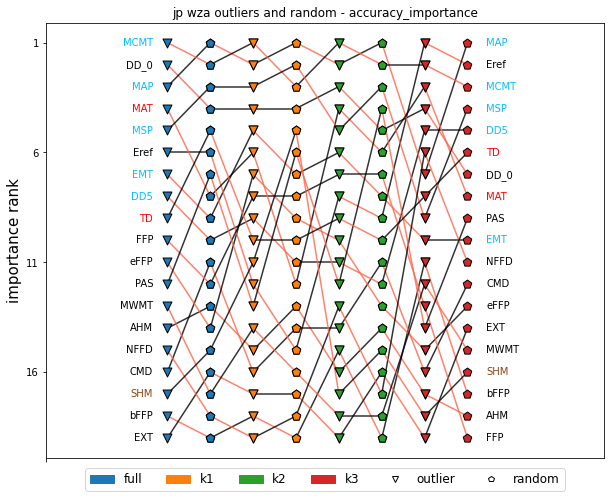

In [26]:
compare_random_outlier(importance='accuracy_importance')

<a id='d'></a>
### weighted and accuracy importance
[top](#home)

In [27]:
def compare_two_importances(impvars=None, shapes=['o', 's'], skip_kfold=False):
    opencircle = mlines.Line2D([],[], color='None', marker=shapes[0], linestyle='None',
                               label='outlier', markeredgecolor='k')
    opensquare = mlines.Line2D([],[], color='None', marker=shapes[1], linestyle='None',
                                label='random', markeredgecolor='k')

    for spp,methoddict in importances.items():
        for method,setdict in methoddict.items():
            title = f'{spp} {method} outliers - {impvars[0]} {impvars[1]}'
            file = op.join(figdir, f'{spp}_{method}_compare_{impvars[0]}_{impvars[1]}_slopegraph.pdf')

            dicts = []
            labels = ['full', 'full']
            if skip_kfold is False:
                for kfold in setdict['real'].keys():
                    if kfold != 'full':
                        dicts.append(setdict['real'][kfold][impvars[0]])
                        dicts.append(setdict['real'][kfold][impvars[1]])
                        labels.extend([kfold, kfold])
            else:
                file = file.replace('_slopegraph.pdf', '_nokfold_slopegraph.pdf')

            print(ColorText(title).bold())
            slope_graph(setdict['real']['full'][impvars[0]],
                        setdict['real']['full'][impvars[1]],
                        *dicts,
                        labels=labels,
                        figsize=(10, 8) if skip_kfold is False else (5, 8),
                        title=title,
                        labeldict=cvar_colors[spp],
                        colors=flatten(list(
                            (x,x) for x  in mcolors.TABLEAU_COLORS
                        )),
                        markers=flatten(list(
                            [shapes[0], shapes[1]] for x in mcolors.TABLEAU_COLORS
                        )),
                        addtolegend=([opencircle, opensquare],
                                     [impvars[0], impvars[1]]),
                        saveloc=file,
                        legendcols=3 if skip_kfold is True else None
                       )
            plt.show()
    pass

combined baypass outliers - weighted_importance accuracy_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/combined_baypass_compare_weighted_importance_accuracy_importance_nokfold_slopegraph.pdf


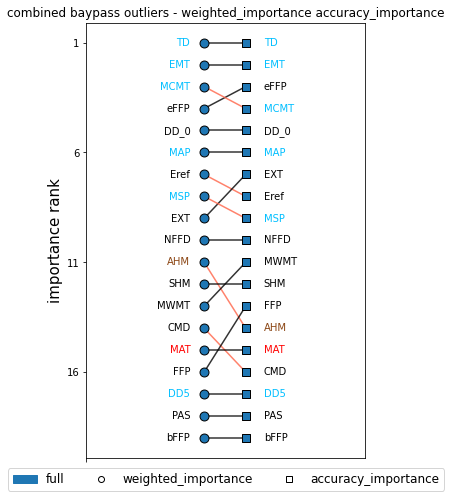

combined wza outliers - weighted_importance accuracy_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/combined_wza_compare_weighted_importance_accuracy_importance_nokfold_slopegraph.pdf


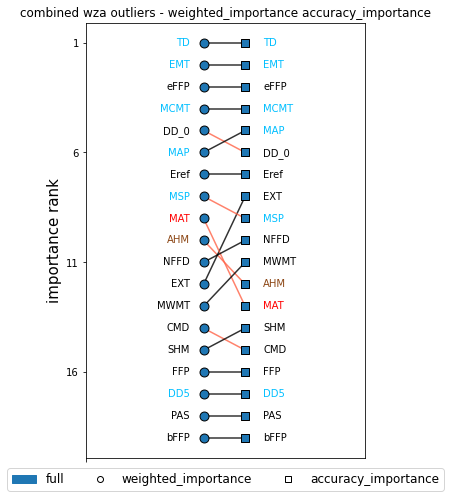

fdc baypass outliers - weighted_importance accuracy_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdc_baypass_compare_weighted_importance_accuracy_importance_nokfold_slopegraph.pdf


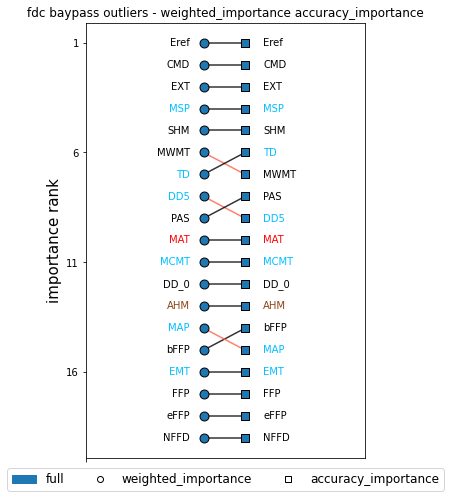

fdc wza outliers - weighted_importance accuracy_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdc_wza_compare_weighted_importance_accuracy_importance_nokfold_slopegraph.pdf


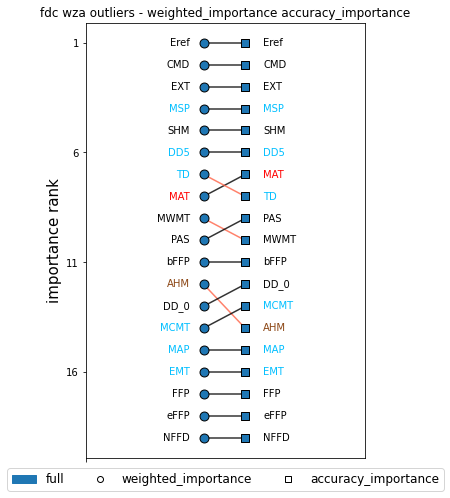

fdi baypass outliers - weighted_importance accuracy_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdi_baypass_compare_weighted_importance_accuracy_importance_nokfold_slopegraph.pdf


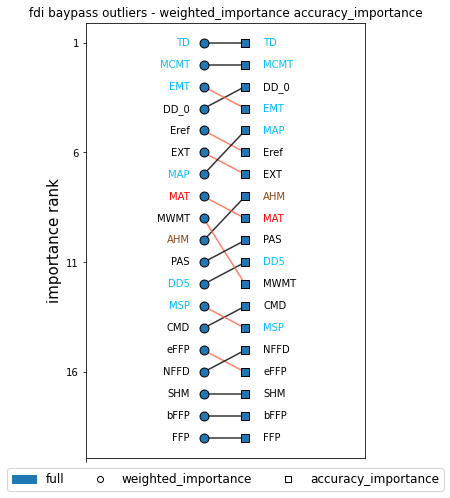

fdi wza outliers - weighted_importance accuracy_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdi_wza_compare_weighted_importance_accuracy_importance_nokfold_slopegraph.pdf


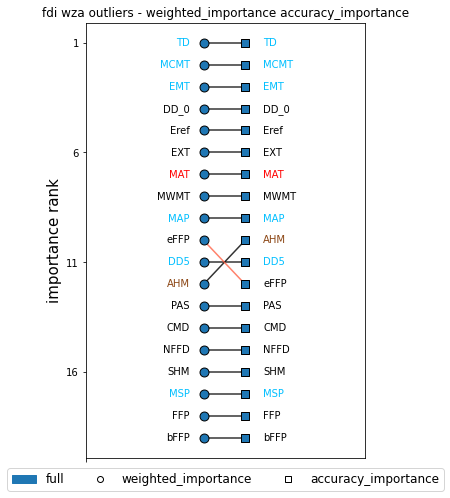

jp baypass outliers - weighted_importance accuracy_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/jp_baypass_compare_weighted_importance_accuracy_importance_nokfold_slopegraph.pdf


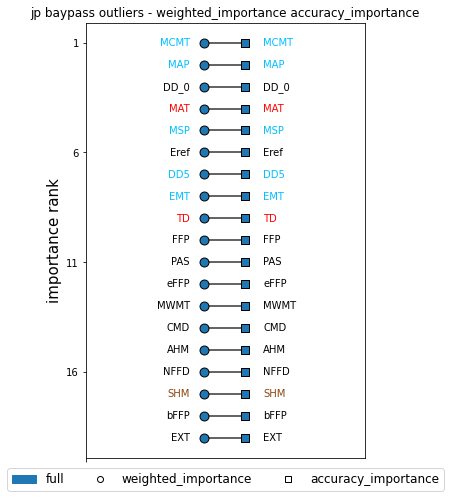

jp wza outliers - weighted_importance accuracy_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/jp_wza_compare_weighted_importance_accuracy_importance_nokfold_slopegraph.pdf


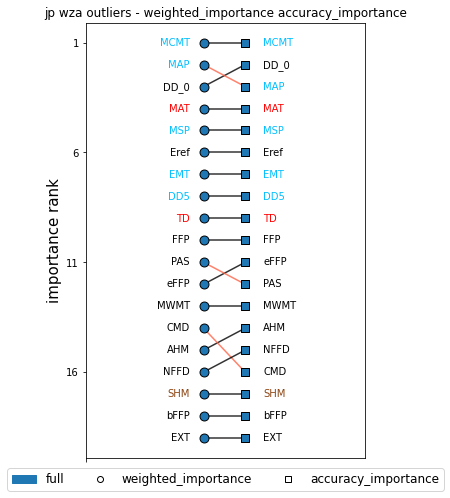

In [28]:
compare_two_importances(['weighted_importance', 'accuracy_importance'], skip_kfold=True)

combined baypass outliers - weighted_importance accuracy_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/combined_baypass_compare_weighted_importance_accuracy_importance_slopegraph.pdf


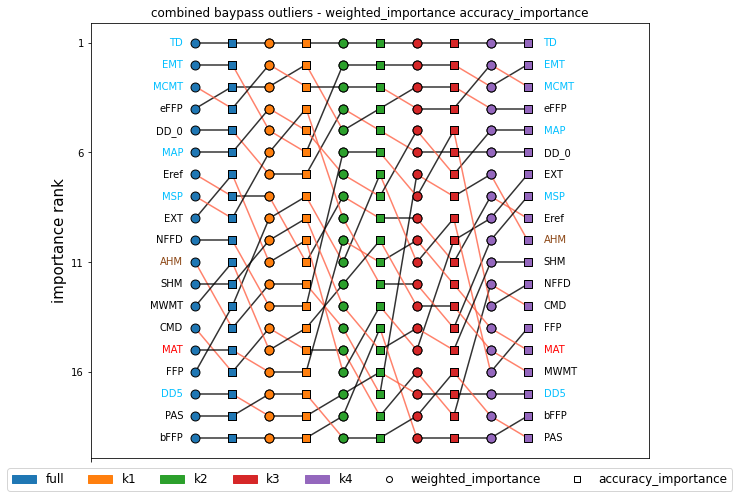

combined wza outliers - weighted_importance accuracy_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/combined_wza_compare_weighted_importance_accuracy_importance_slopegraph.pdf


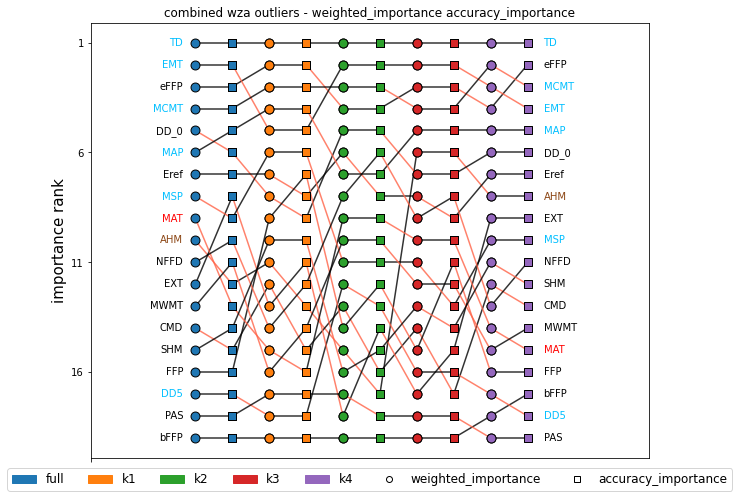

fdc baypass outliers - weighted_importance accuracy_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdc_baypass_compare_weighted_importance_accuracy_importance_slopegraph.pdf


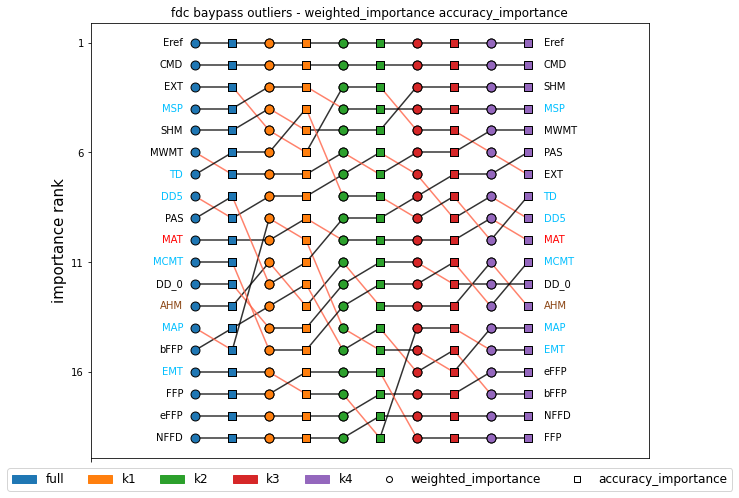

fdc wza outliers - weighted_importance accuracy_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdc_wza_compare_weighted_importance_accuracy_importance_slopegraph.pdf


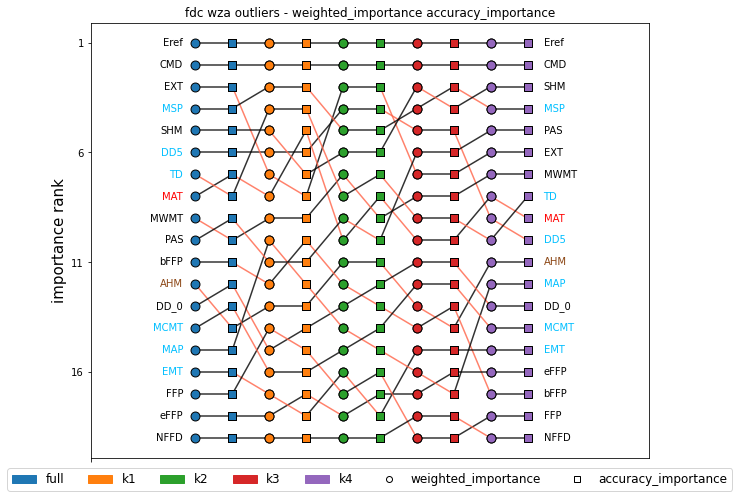

fdi baypass outliers - weighted_importance accuracy_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdi_baypass_compare_weighted_importance_accuracy_importance_slopegraph.pdf


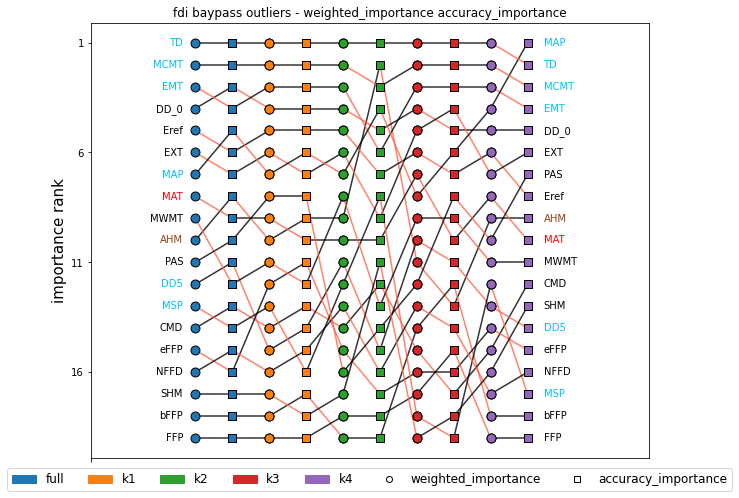

fdi wza outliers - weighted_importance accuracy_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdi_wza_compare_weighted_importance_accuracy_importance_slopegraph.pdf


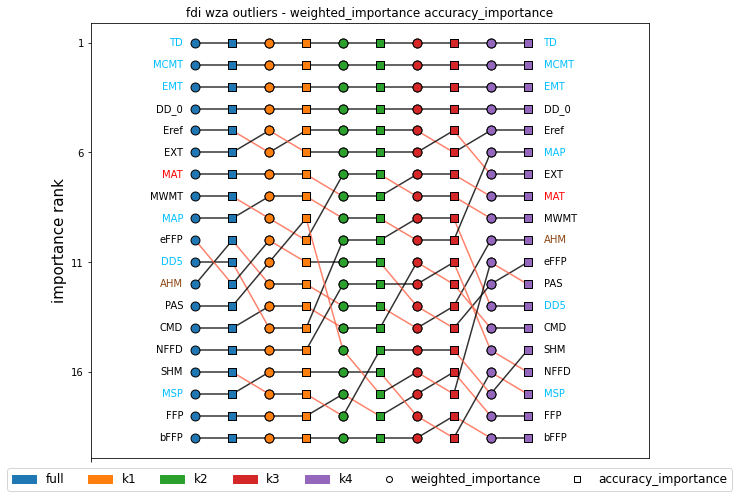

jp baypass outliers - weighted_importance accuracy_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/jp_baypass_compare_weighted_importance_accuracy_importance_slopegraph.pdf


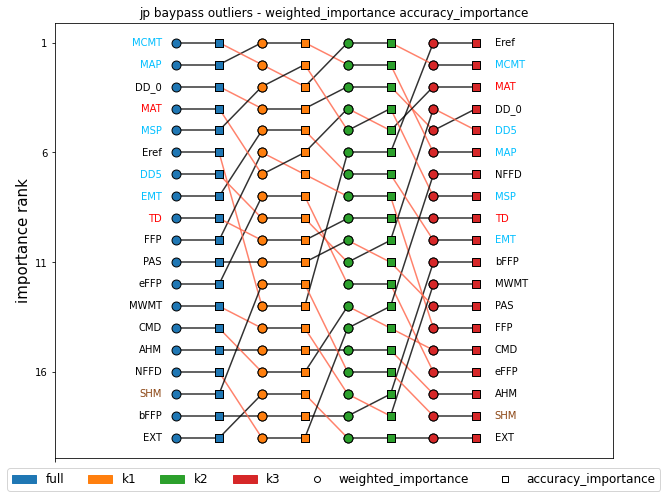

jp wza outliers - weighted_importance accuracy_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/jp_wza_compare_weighted_importance_accuracy_importance_slopegraph.pdf


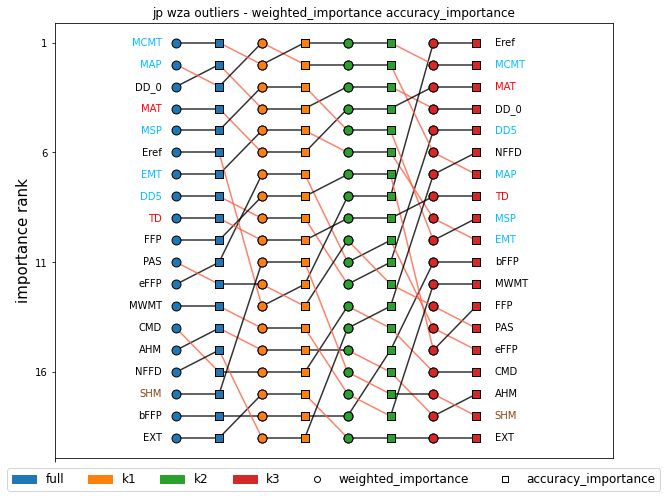

In [29]:
compare_two_importances(['weighted_importance', 'accuracy_importance'])

combined baypass outliers - weighted_importance overall_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/combined_baypass_compare_weighted_importance_overall_importance_slopegraph.pdf


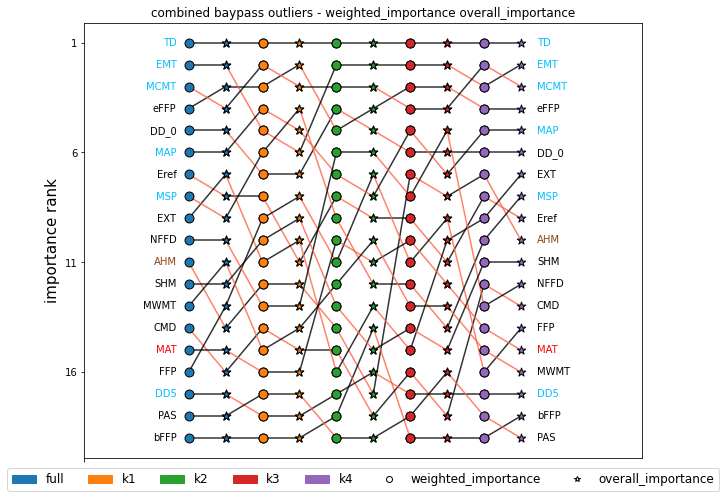

combined wza outliers - weighted_importance overall_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/combined_wza_compare_weighted_importance_overall_importance_slopegraph.pdf


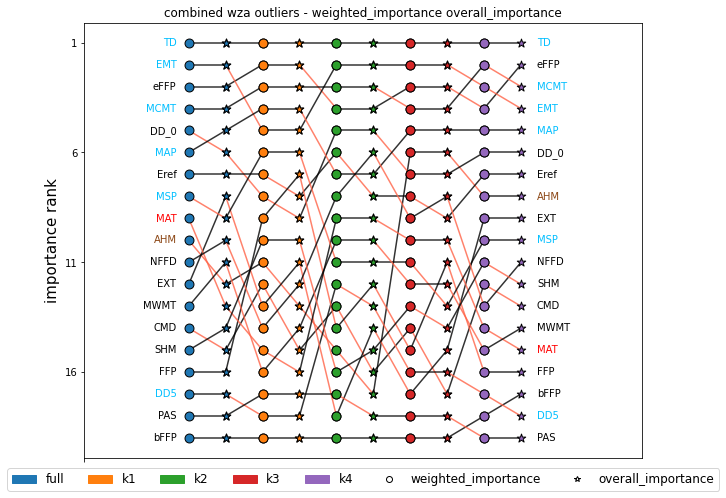

fdc baypass outliers - weighted_importance overall_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdc_baypass_compare_weighted_importance_overall_importance_slopegraph.pdf


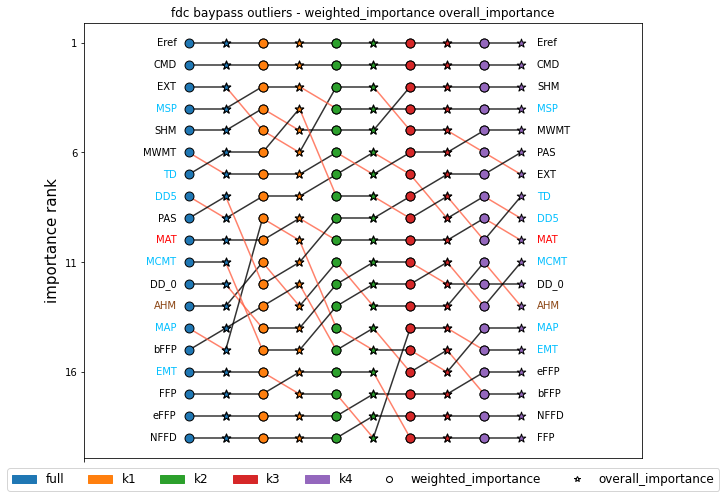

fdc wza outliers - weighted_importance overall_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdc_wza_compare_weighted_importance_overall_importance_slopegraph.pdf


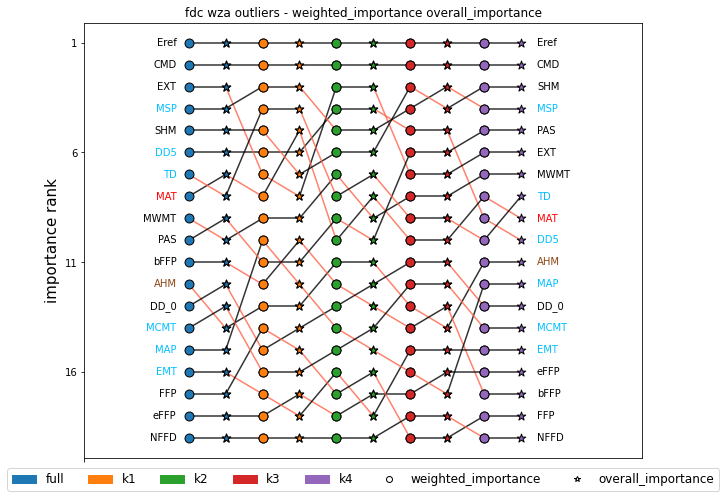

fdi baypass outliers - weighted_importance overall_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdi_baypass_compare_weighted_importance_overall_importance_slopegraph.pdf


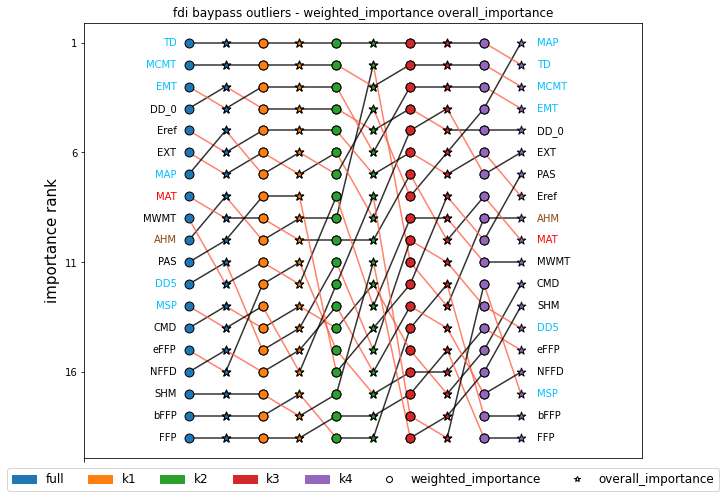

fdi wza outliers - weighted_importance overall_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdi_wza_compare_weighted_importance_overall_importance_slopegraph.pdf


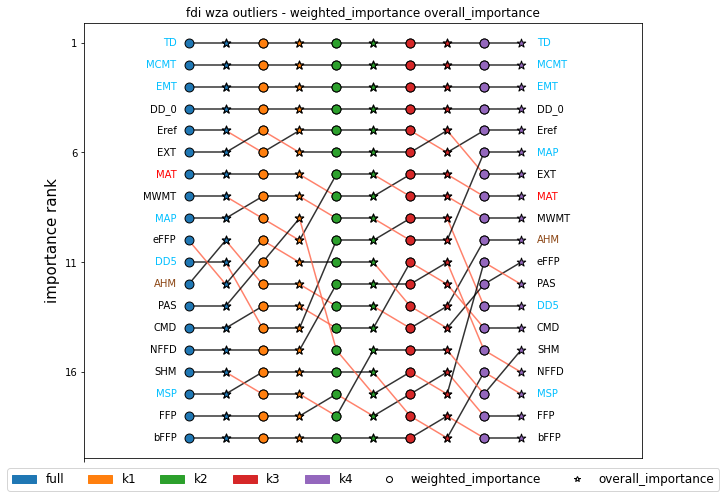

jp baypass outliers - weighted_importance overall_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/jp_baypass_compare_weighted_importance_overall_importance_slopegraph.pdf


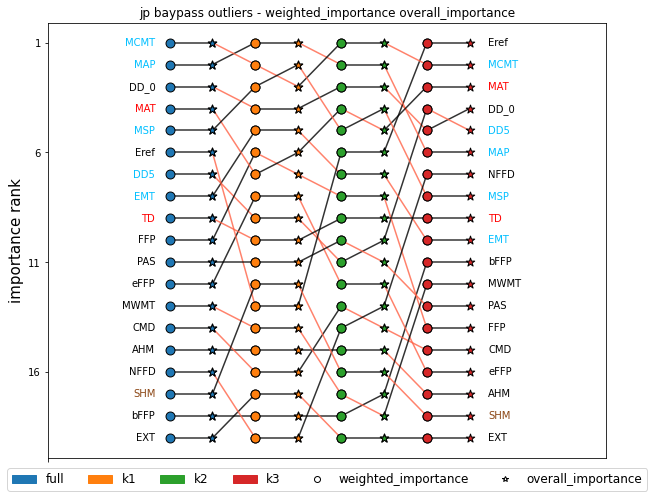

jp wza outliers - weighted_importance overall_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/jp_wza_compare_weighted_importance_overall_importance_slopegraph.pdf


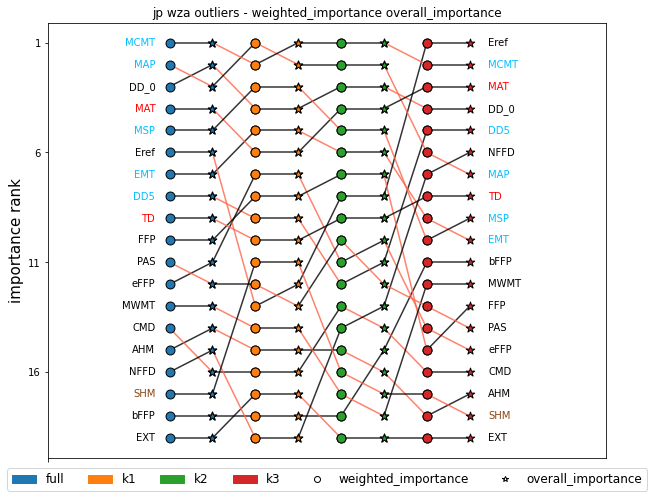

In [30]:
compare_two_importances(['weighted_importance', 'overall_importance'], shapes=['o', '*'])

combined baypass outliers - accuracy_importance overall_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/combined_baypass_compare_accuracy_importance_overall_importance_slopegraph.pdf


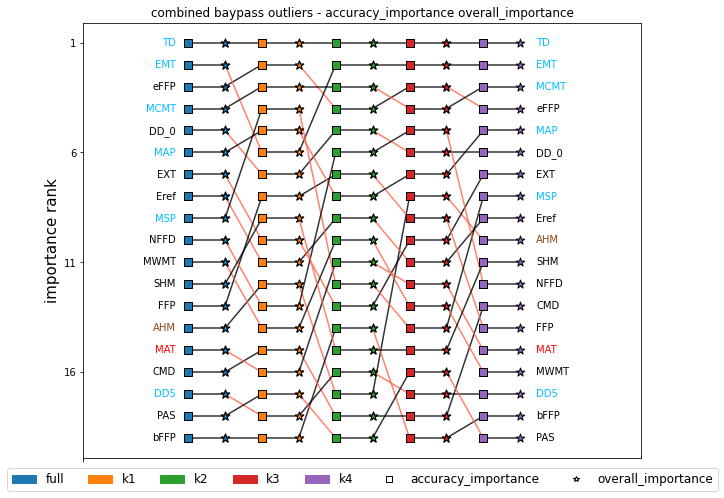

combined wza outliers - accuracy_importance overall_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/combined_wza_compare_accuracy_importance_overall_importance_slopegraph.pdf


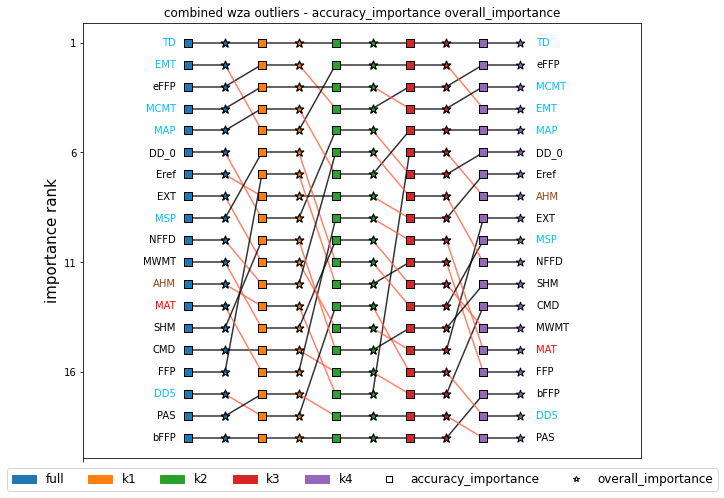

fdc baypass outliers - accuracy_importance overall_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdc_baypass_compare_accuracy_importance_overall_importance_slopegraph.pdf


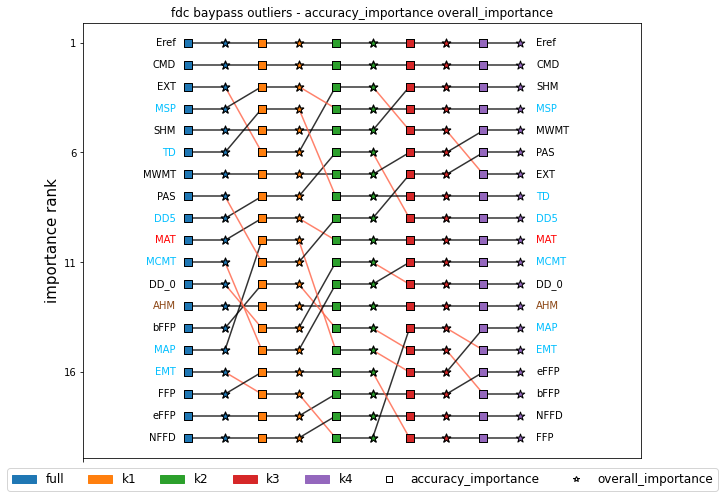

fdc wza outliers - accuracy_importance overall_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdc_wza_compare_accuracy_importance_overall_importance_slopegraph.pdf


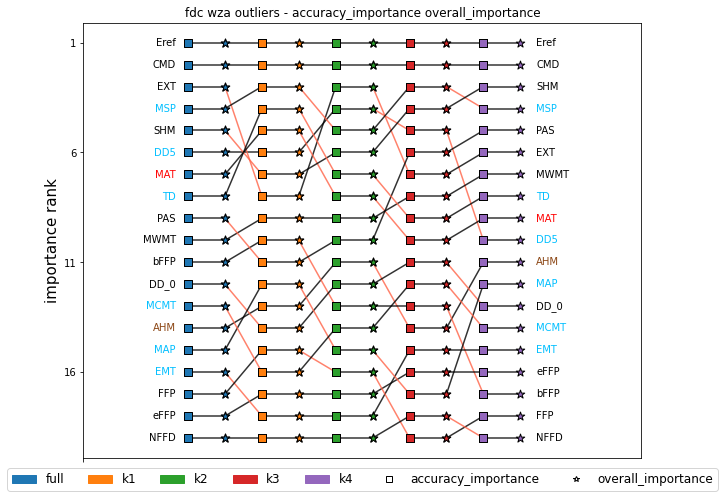

fdi baypass outliers - accuracy_importance overall_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdi_baypass_compare_accuracy_importance_overall_importance_slopegraph.pdf


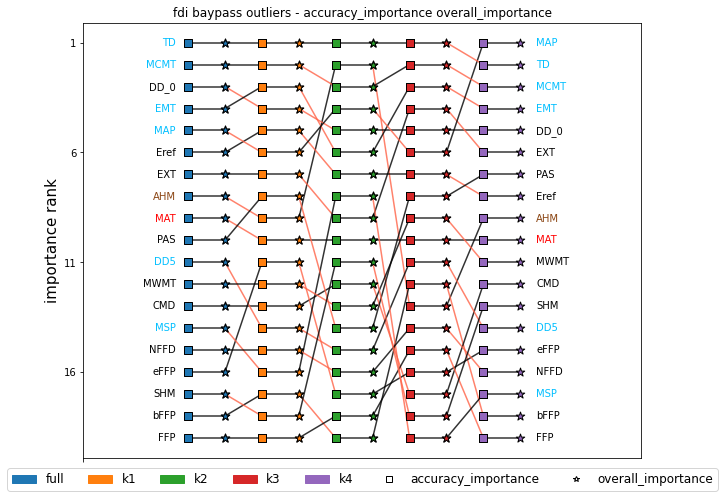

fdi wza outliers - accuracy_importance overall_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdi_wza_compare_accuracy_importance_overall_importance_slopegraph.pdf


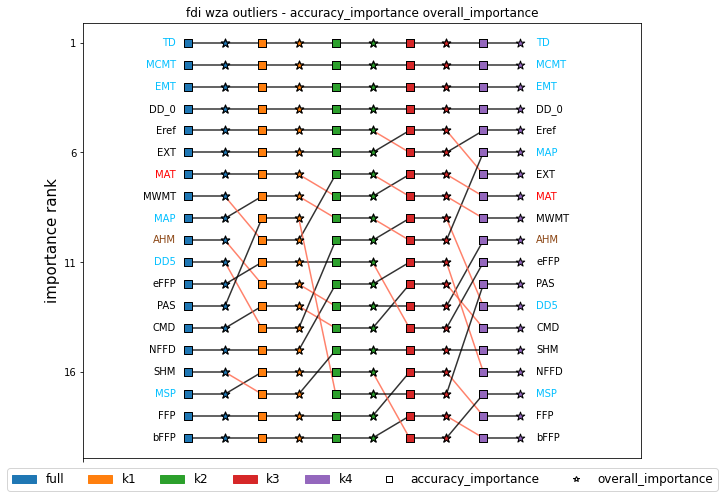

jp baypass outliers - accuracy_importance overall_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/jp_baypass_compare_accuracy_importance_overall_importance_slopegraph.pdf


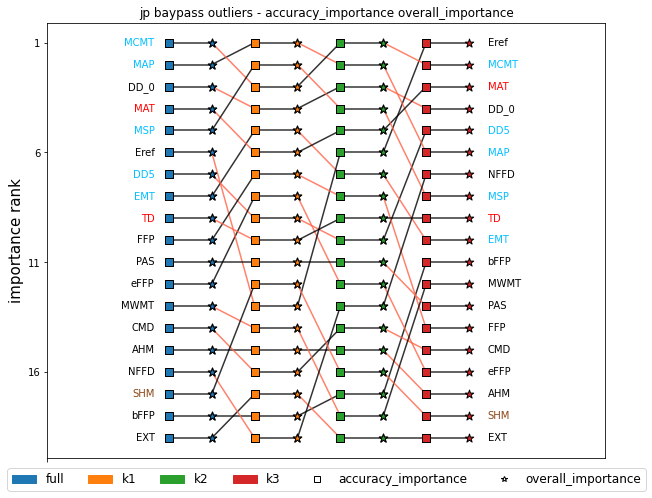

jp wza outliers - accuracy_importance overall_importance
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/jp_wza_compare_accuracy_importance_overall_importance_slopegraph.pdf


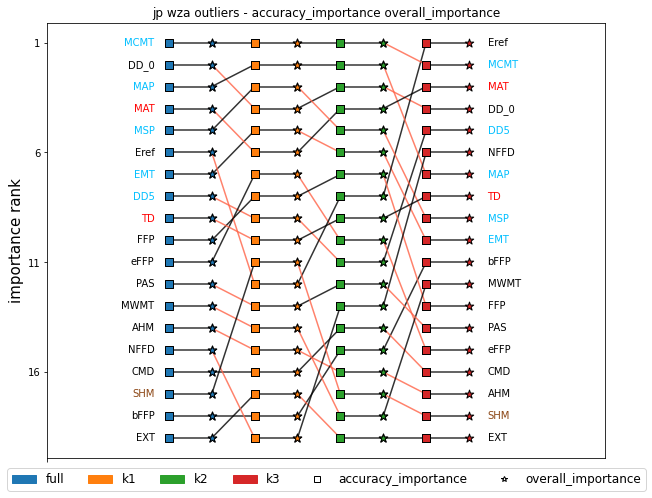

In [31]:
compare_two_importances(['accuracy_importance', 'overall_importance'], shapes=['s', '*'])

In [32]:
figdir

'/data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance'

In [33]:
# opencircle = mlines.Line2D([],[], color='None', marker='o', linestyle='None',
#                                label='weighted', markeredgecolor='k')
# brownsquare = mlines.Line2D([], [], color='tab:brown', marker='s', linestyle='None', 
#                      label='accuracy', markeredgecolor='k')

# compare_across_runs(importance='accuracy_importance',
#                     markers=['o','o','o', 'o', 'o', 's'],
#                     addtolegend=([opencircle, brownsquare], ['accuracy importance', 'weighted importance']),
#                     add_full_importance='weighted_importance',
#                     legendcols=3,
#                     bbox_to_anchor=(0.5, -0.09)
#                    )

In [34]:
# opencircle = mlines.Line2D([],[], color='None', marker='o', linestyle='None',
#                                label='weighted', markeredgecolor='k')
# brownsquare = mlines.Line2D([], [], color='tab:brown', marker='s', linestyle='None', 
#                      label='accuracy', markeredgecolor='k')

# compare_across_runs(importance='accuracy_importance',
#                     markers=['o','o','o', 'o', 'o', 's'],
#                     addtolegend=([opencircle, brownsquare], ['accuracy importance', 'weighted importance']),
#                     add_full_importance='weighted_importance',
#                     legendcols=3,
#                     bbox_to_anchor=(0.5, -0.09)
#                    )

<a id='bars'></a>
# 3. plot figures as in GF manual

plot the factor importances like in manual (`plot(gfOut, plotType='O')`)

[top](#home)

In [35]:
def create_subplots(importance_dict, spp, importance='overall_importance', colors=list(mcolors.TABLEAU_COLORS),
                    figsize=(23, 8), saveloc=None, add_weighted=None):
    """Create side-by-side horizontal boxplots of ordered importance scores."""
    if add_weighted is not None:
        colors = colors[:len(importance_dict)] + ['tab:brown']
        importance_dict = copy.deepcopy(importance_dict)
        importance_dict['weighted_importance'] = pd.DataFrame(add_weighted)
        importance_dict['weighted_importance'].columns = [importance]  # hacky way to get it to work
        
    fig,axs = plt.subplots(1, len(importance_dict), figsize=figsize)
    maxx = 0
    for i,(kfold,ax) in enumerate(zip(importance_dict.keys(), axs)):
#         vals = importance_dict[kfold][importance].copy()
        vals = importance_dict[kfold].sort_values(by=importance, ascending=False)[importance].copy()
        ax.barh(range(len(vals)), vals, color=colors[i])
        ax.set_yticks(range(len(vals)))
#         print(keys(vals))
        ax.set_yticklabels(keys(vals),
                           fontsize=18,
#                            color=[colorConverter.to_rgb(cvar_colors[spp][key]) for key in keys(vals)]
                          )  # godzilla
#         for i,tick in enumerate(ax.yaxis.get_ticklabels()):
#             tick.set_color(cvar_colors[spp][keys(vals)[i]])
        #ax.set_xticklabels(ax.get_xticklabels(), fontsize=18)
        for i,label in enumerate(ax.get_xticklabels()):
            label.set_fontsize(15)
            #label.set_color(cvar_colors[spp][keys(vals)[i]])
        for i,label in enumerate(ax.get_yticklabels()):
            label.set_color(cvar_colors[spp][keys(vals)[i]])
        ax.tick_params(labelrotation=30)
        ax.set_title(kfold, fontdict=dict(fontsize=20))
        ax.invert_yaxis()
        # figure out common xlim
        xmin,xmax = ax.get_xlim()
        if (i+1)==len(axs) and add_weighted is not None:
            continue
        if xmax > maxx:
            maxx = xmax

    # set common xlim, except for add_weighted
    for i,ax in enumerate(axs):
        if (i+1)==len(axs) and add_weighted is not None:
            continue
        ax.set_xlim((0,maxx))
        
    # set common xlabel 
    xlabel = importance.replace('_', ' ').replace('weighted', '$R^2$ weighted')
    fig.text(0.5, -0.05, xlabel, ha='center', fontsize=20)
    fig.tight_layout()

    if saveloc is not None:
        save_pdf(saveloc)

    plt.show()
    
    pass

In [36]:
for spp,methoddict in importances.items():
    for method, setdict in methoddict.items():
        for setname, importance_dict in setdict.items():
            break
        break
    break
importance_dict.keys()

dict_keys(['full', 'k1', 'k2', 'k3', 'k4'])

In [37]:
importances[spp][method][setname][kfold]

,overall_importance,weighted_importance,accuracy_importance
AHM,0.000287,0.011487,0.000287
bFFP,0.000081,0.004626,0.000081
CMD,0.000059,0.003901,0.000059
DD_0,0.000544,0.020828,0.000544
DD5,0.000123,0.005126,0.000123
eFFP,0.001113,0.039773,0.001113
EMT,0.001692,0.059964,0.001692
Eref,0.000124,0.005541,0.000124
EXT,0.000133,0.005308,0.000133
FFP,0.000315,0.012328,0.000315


In [38]:
def wrap_create(importance='overall_importance', add_weighted=None, **kwargs):
    for spp, methoddict in importances.items():
        for method, setdict in methoddict.items():
            for setname, importance_dict in setdict.items():
                print(ColorText(f'{spp} {method} {setname}').bold())
                file = op.join(figdir, f'{spp}_{method}_{setname}_{importance}_bargraph.pdf')
                if add_weighted is not None:
                    add_weighted = importance_dict['full']['weighted_importance']
                    file = file.replace("_bargraph.pdf", "_and_weighted_bargraph.pdf")
                create_subplots(importance_dict, spp, importance=importance, saveloc=file, add_weighted=add_weighted)
    pass

combined baypass random
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/combined_baypass_random_accuracy_importance_bargraph.pdf


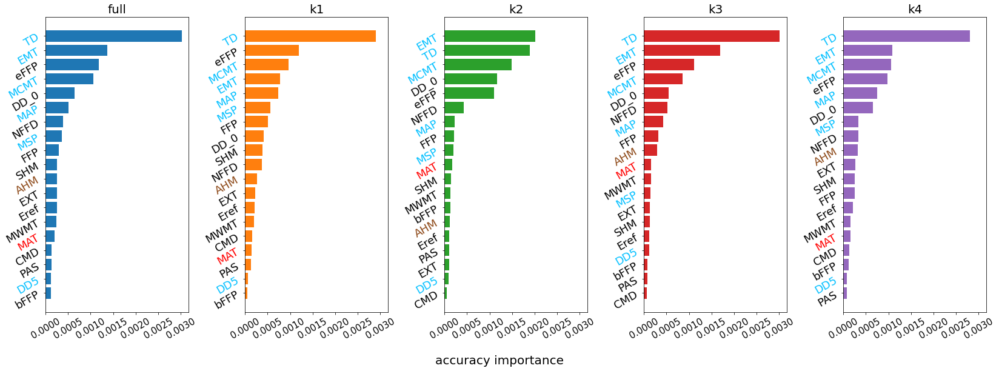

combined baypass real
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/combined_baypass_real_accuracy_importance_bargraph.pdf


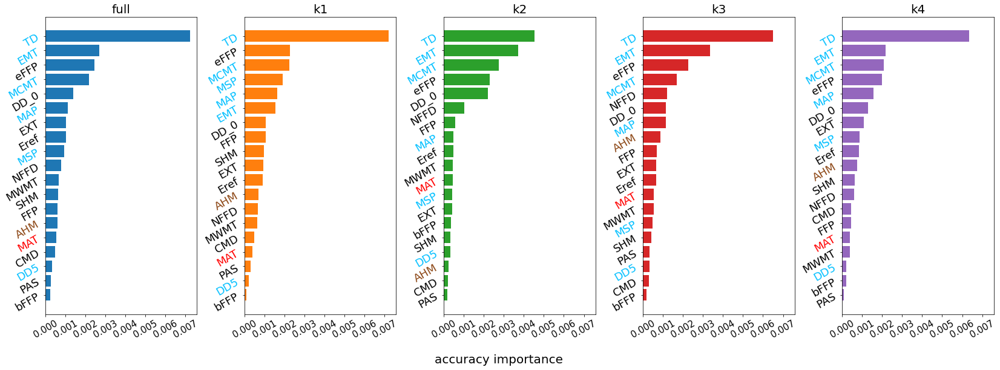

combined wza random
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/combined_wza_random_accuracy_importance_bargraph.pdf


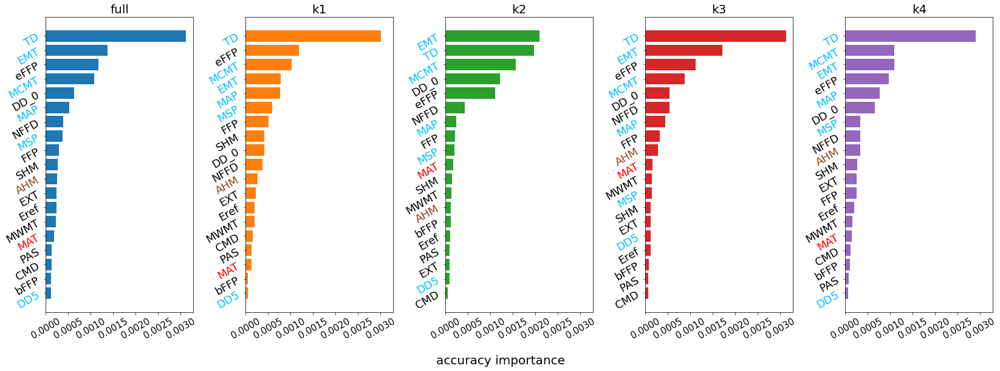

combined wza real
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/combined_wza_real_accuracy_importance_bargraph.pdf


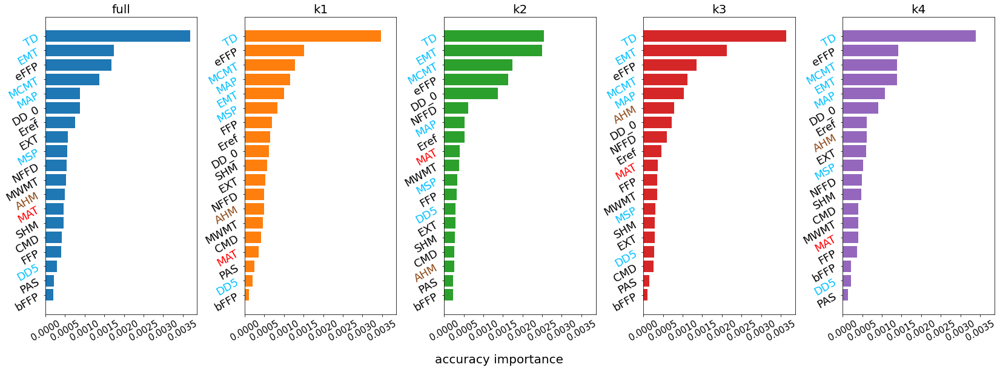

fdc baypass random
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdc_baypass_random_accuracy_importance_bargraph.pdf


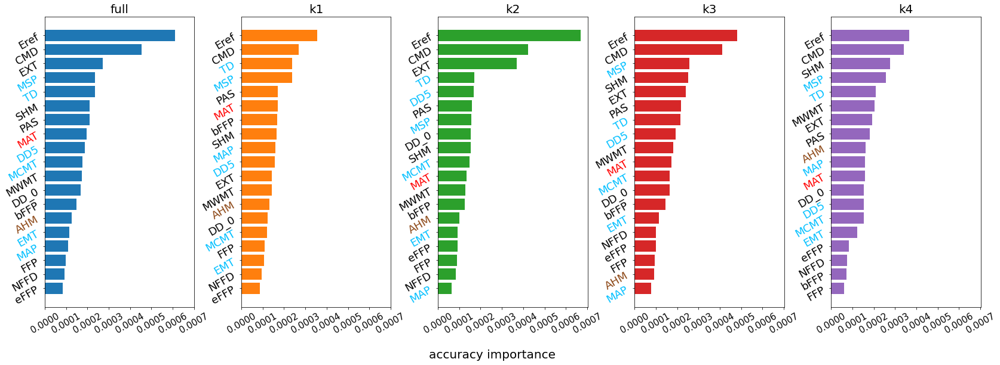

fdc baypass real
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdc_baypass_real_accuracy_importance_bargraph.pdf


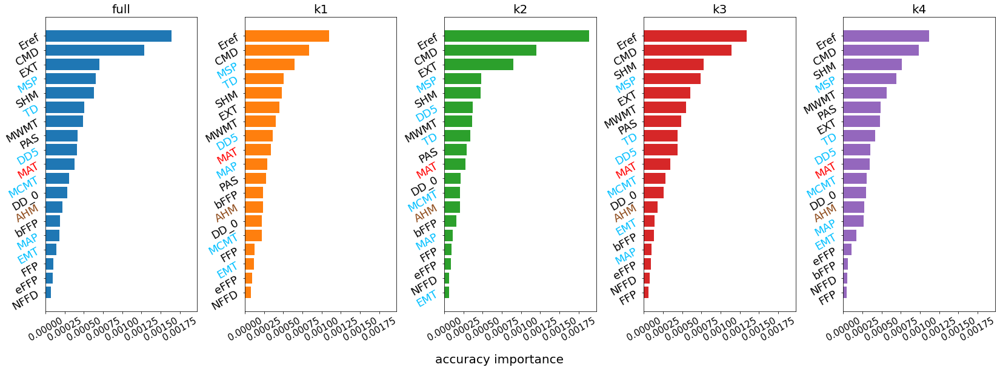

fdc wza random
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdc_wza_random_accuracy_importance_bargraph.pdf


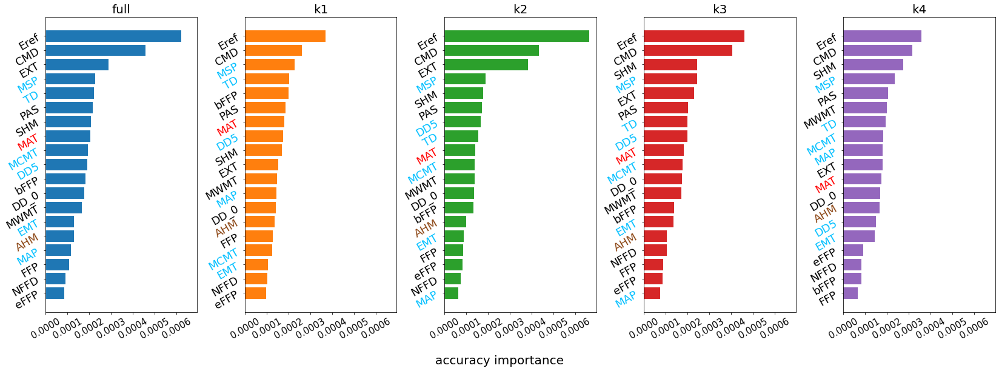

fdc wza real
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdc_wza_real_accuracy_importance_bargraph.pdf


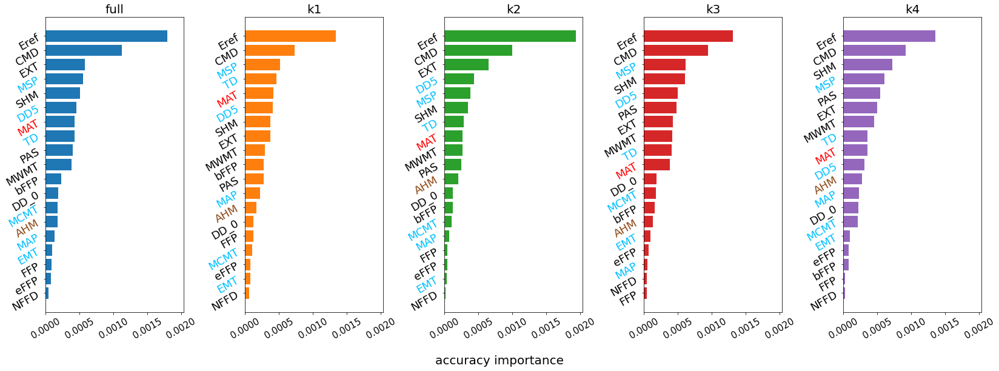

fdi baypass random
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdi_baypass_random_accuracy_importance_bargraph.pdf


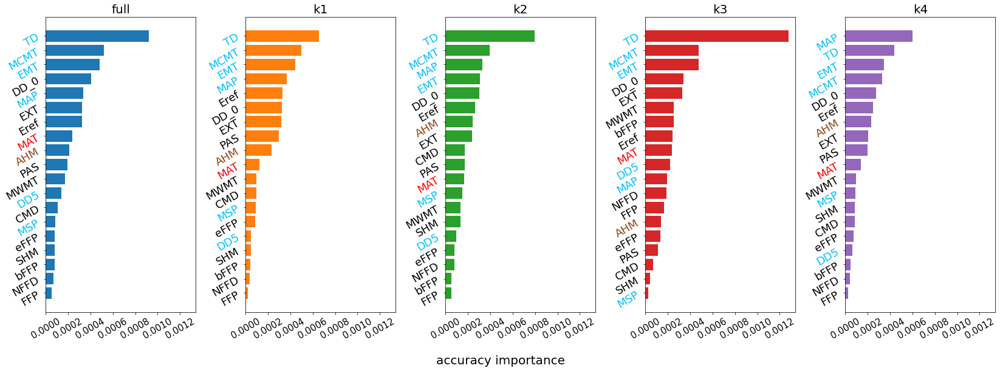

fdi baypass real
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdi_baypass_real_accuracy_importance_bargraph.pdf


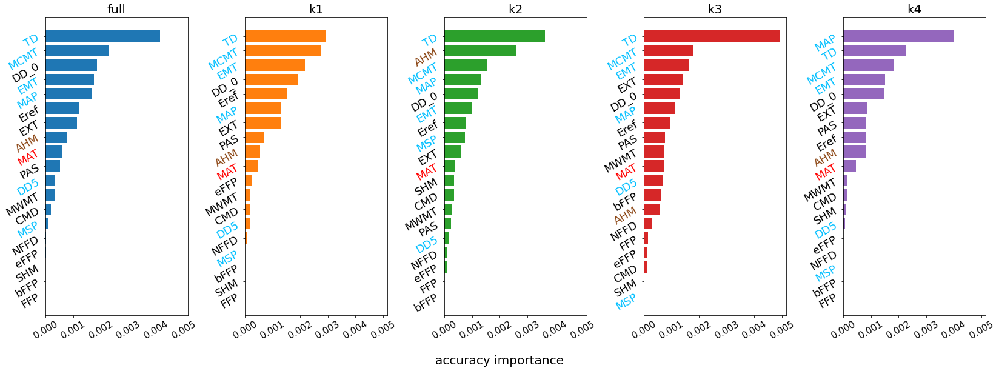

fdi wza random
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdi_wza_random_accuracy_importance_bargraph.pdf


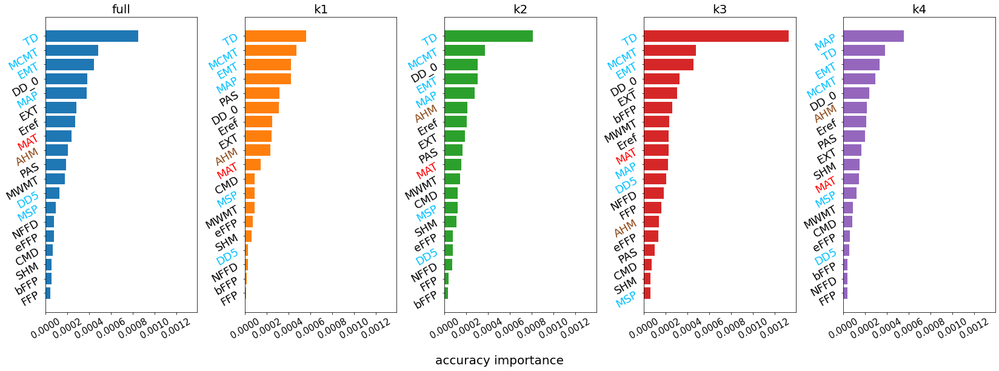

fdi wza real
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdi_wza_real_accuracy_importance_bargraph.pdf


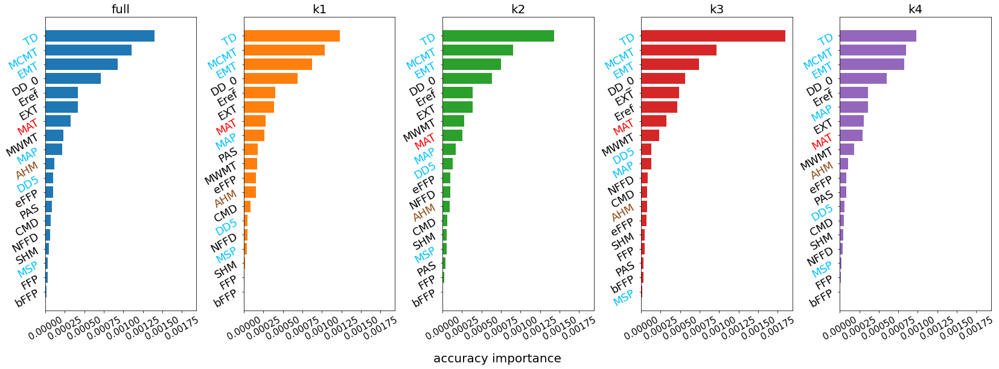

jp baypass random
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/jp_baypass_random_accuracy_importance_bargraph.pdf


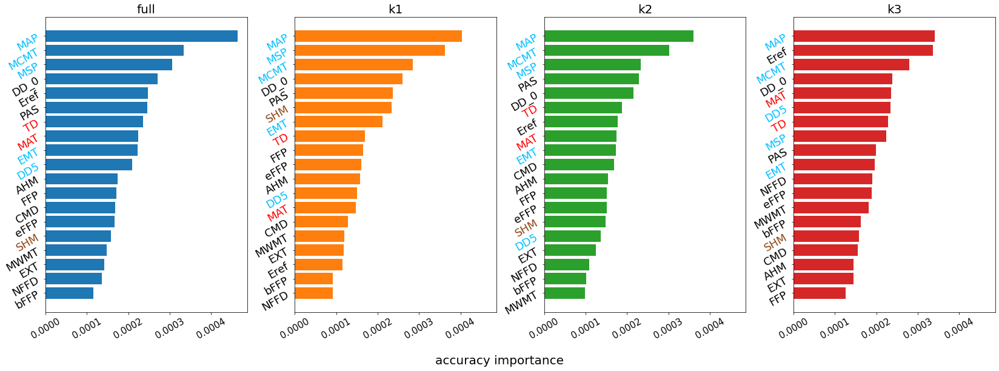

jp baypass real
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/jp_baypass_real_accuracy_importance_bargraph.pdf


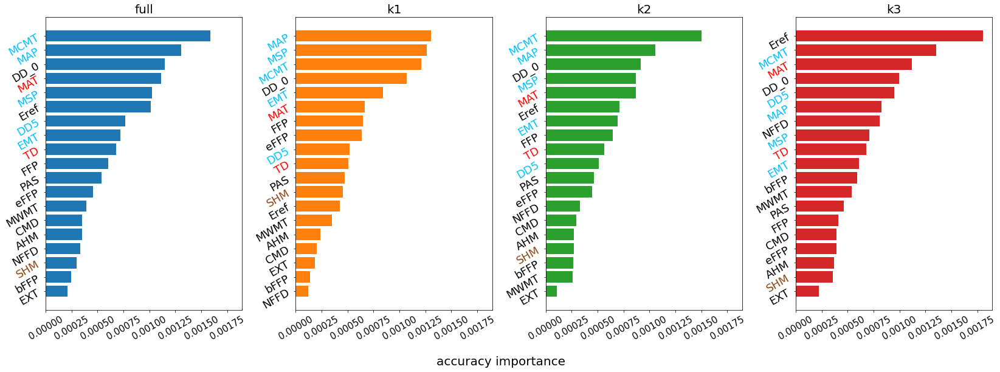

jp wza random
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/jp_wza_random_accuracy_importance_bargraph.pdf


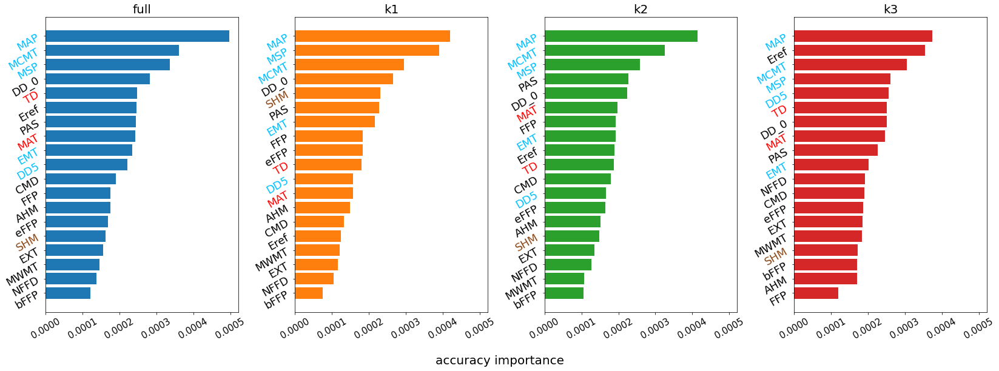

jp wza real
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/jp_wza_real_accuracy_importance_bargraph.pdf


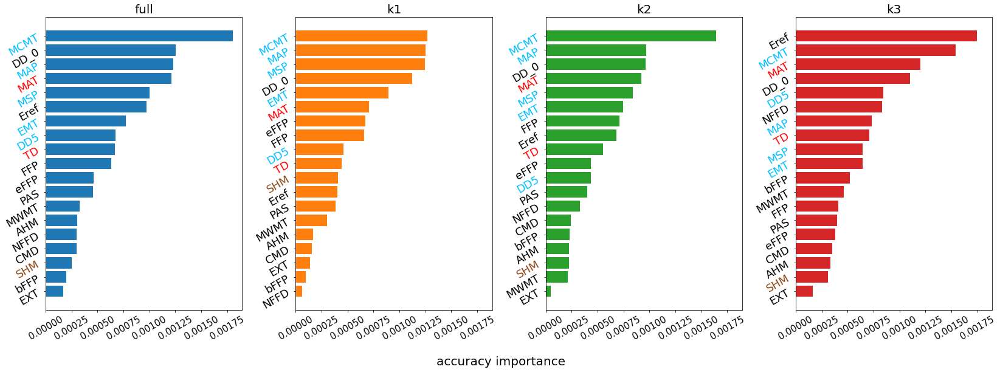

In [39]:
wrap_create(importance='accuracy_importance')

combined baypass random
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/combined_baypass_random_weighted_importance_bargraph.pdf


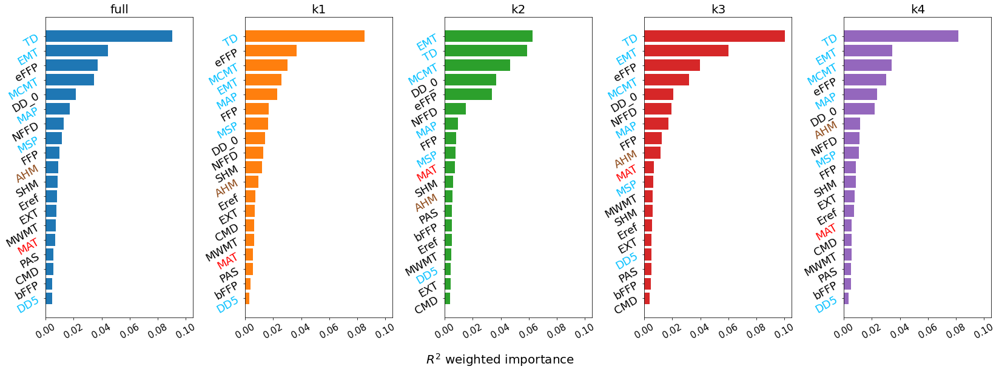

combined baypass real
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/combined_baypass_real_weighted_importance_bargraph.pdf


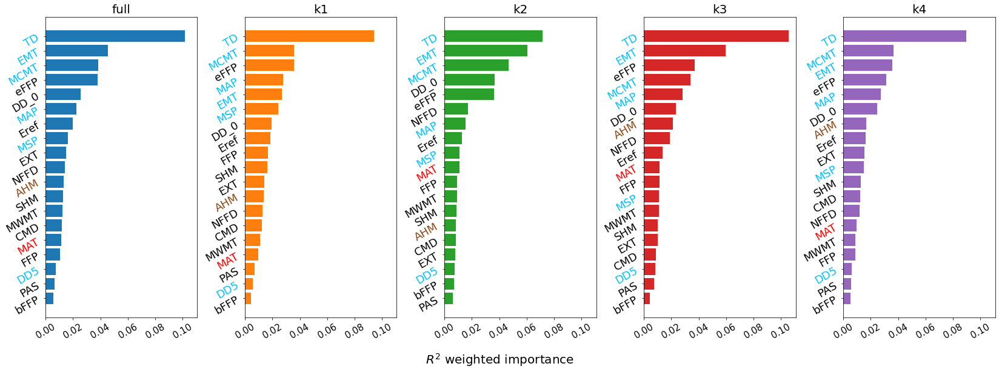

combined wza random
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/combined_wza_random_weighted_importance_bargraph.pdf


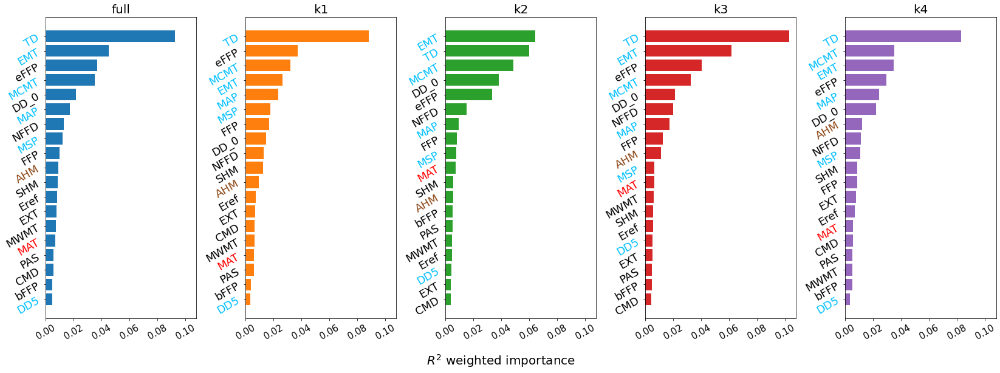

combined wza real
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/combined_wza_real_weighted_importance_bargraph.pdf


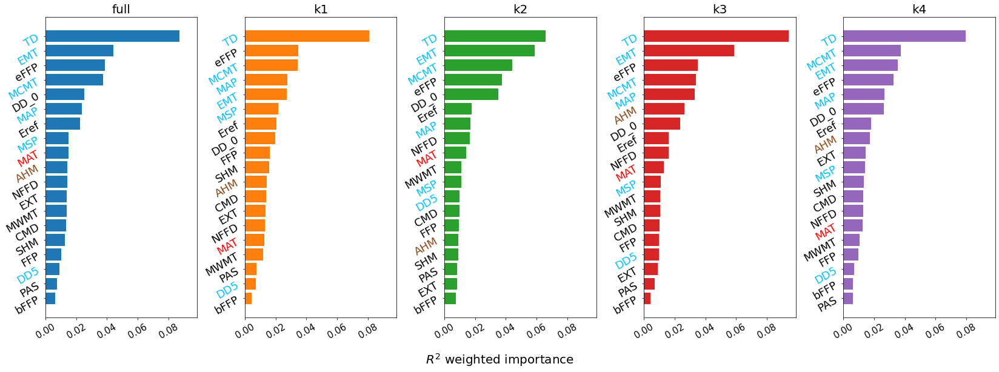

fdc baypass random
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdc_baypass_random_weighted_importance_bargraph.pdf


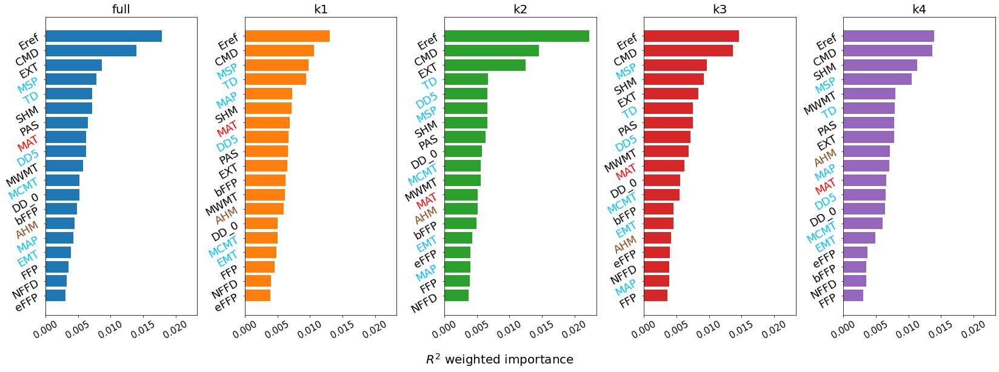

fdc baypass real
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdc_baypass_real_weighted_importance_bargraph.pdf


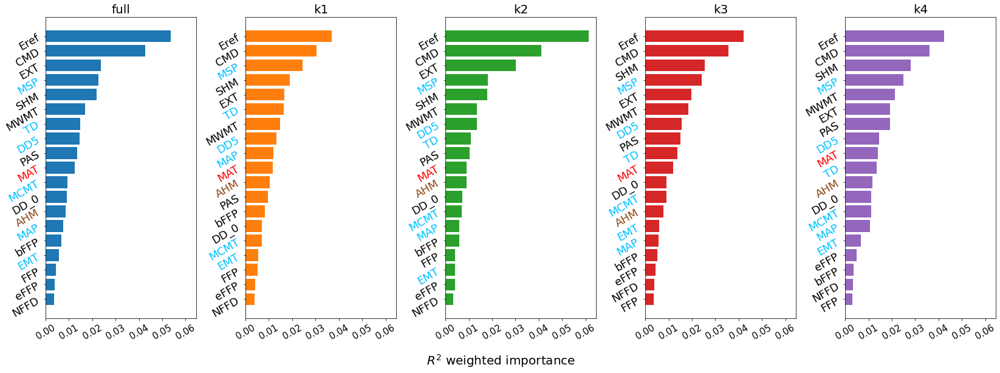

fdc wza random
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdc_wza_random_weighted_importance_bargraph.pdf


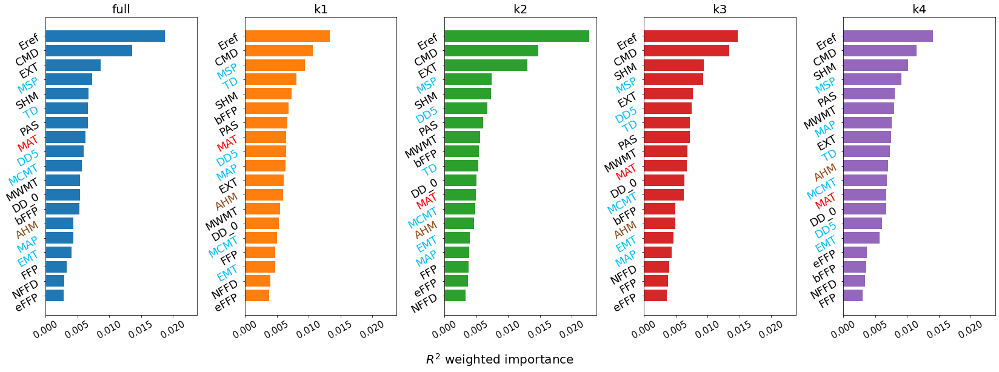

fdc wza real
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdc_wza_real_weighted_importance_bargraph.pdf


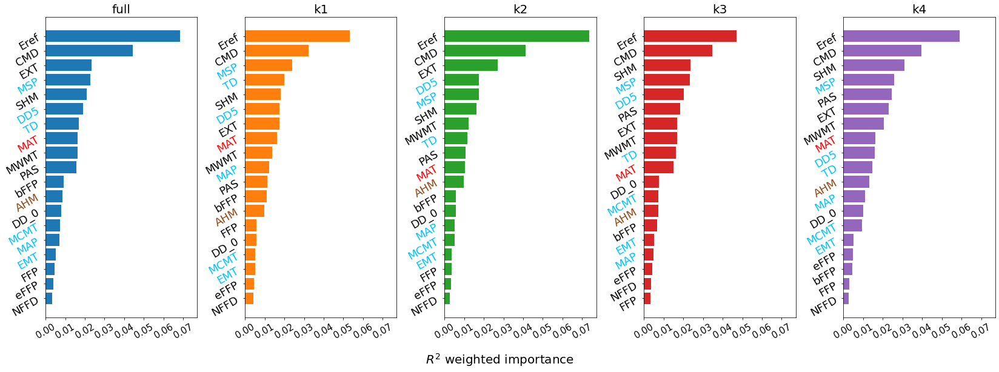

fdi baypass random
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdi_baypass_random_weighted_importance_bargraph.pdf


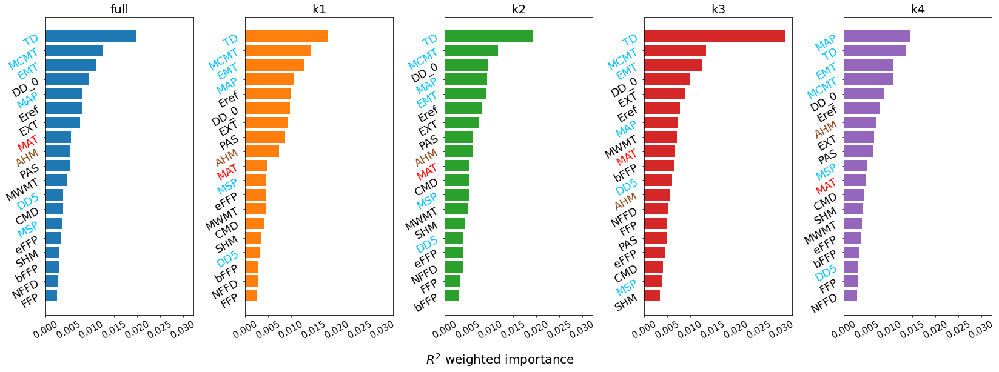

fdi baypass real
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdi_baypass_real_weighted_importance_bargraph.pdf


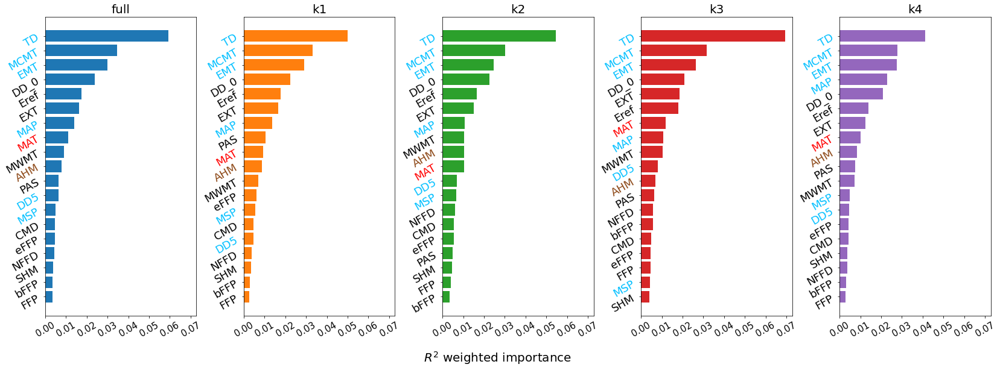

fdi wza random
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdi_wza_random_weighted_importance_bargraph.pdf


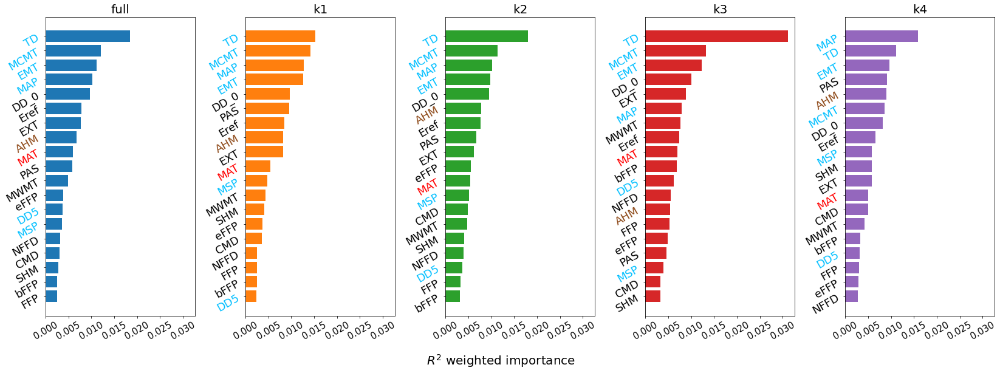

fdi wza real
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdi_wza_real_weighted_importance_bargraph.pdf


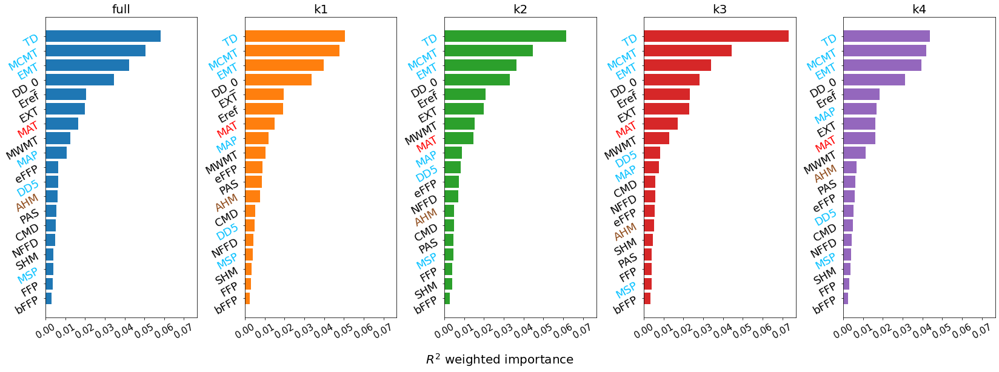

jp baypass random
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/jp_baypass_random_weighted_importance_bargraph.pdf


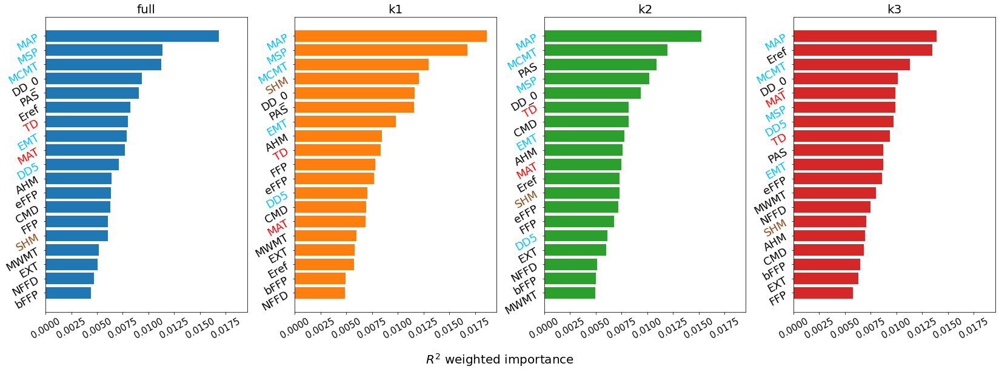

jp baypass real
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/jp_baypass_real_weighted_importance_bargraph.pdf


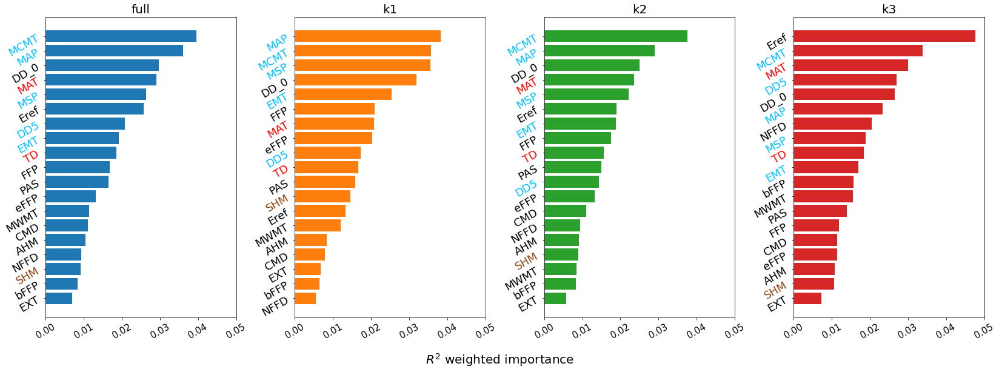

jp wza random
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/jp_wza_random_weighted_importance_bargraph.pdf


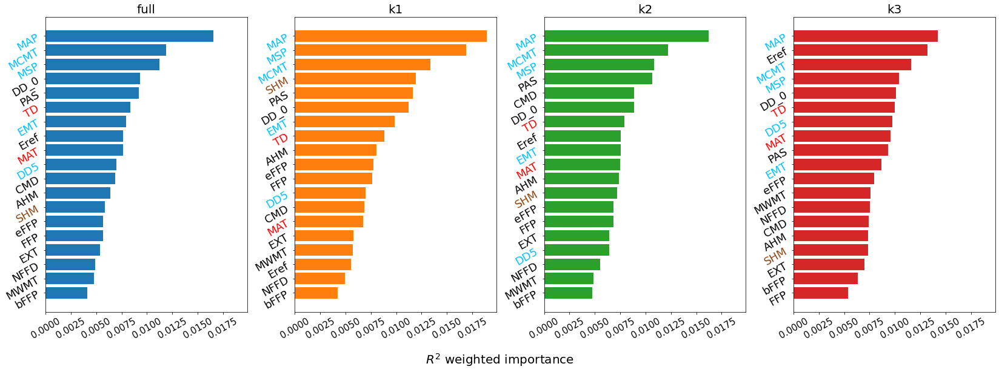

jp wza real
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/jp_wza_real_weighted_importance_bargraph.pdf


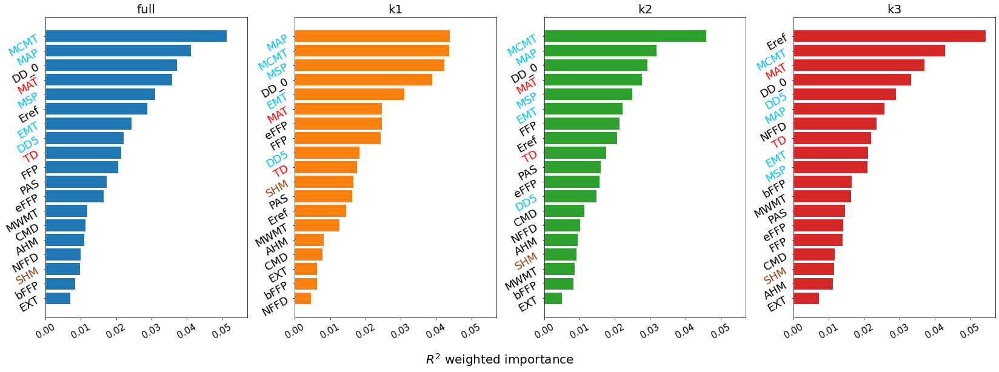

In [40]:
wrap_create(importance='weighted_importance')

combined baypass random
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/combined_baypass_random_overall_importance_bargraph.pdf


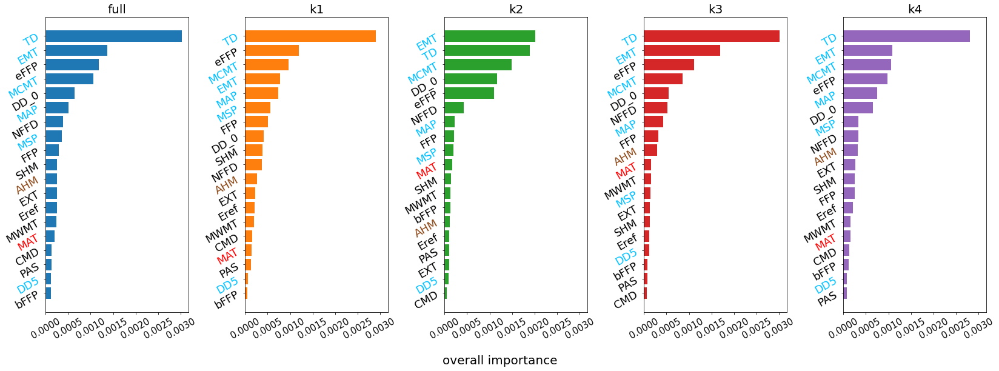

combined baypass real
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/combined_baypass_real_overall_importance_bargraph.pdf


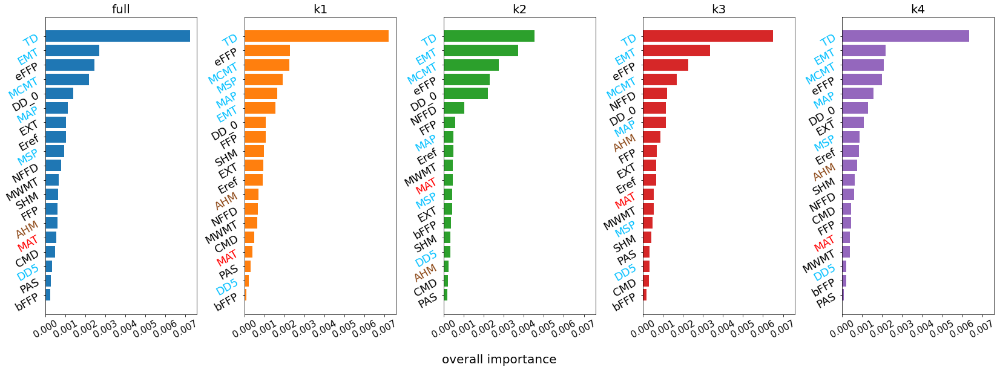

combined wza random
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/combined_wza_random_overall_importance_bargraph.pdf


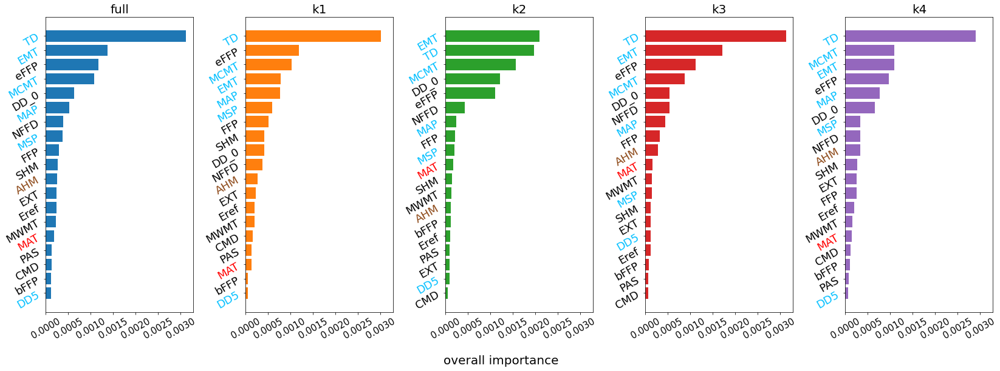

combined wza real
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/combined_wza_real_overall_importance_bargraph.pdf


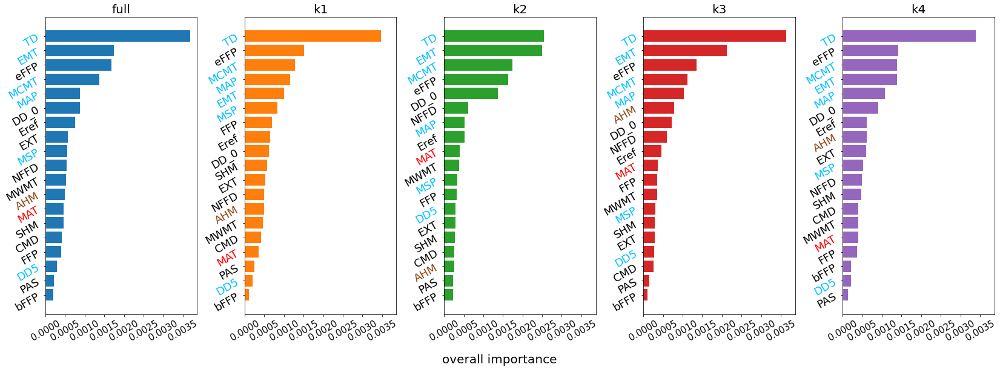

fdc baypass random
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdc_baypass_random_overall_importance_bargraph.pdf


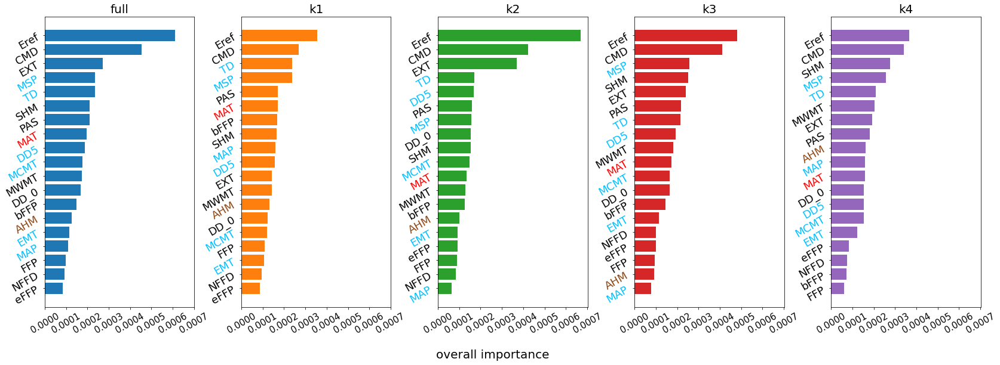

fdc baypass real
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdc_baypass_real_overall_importance_bargraph.pdf


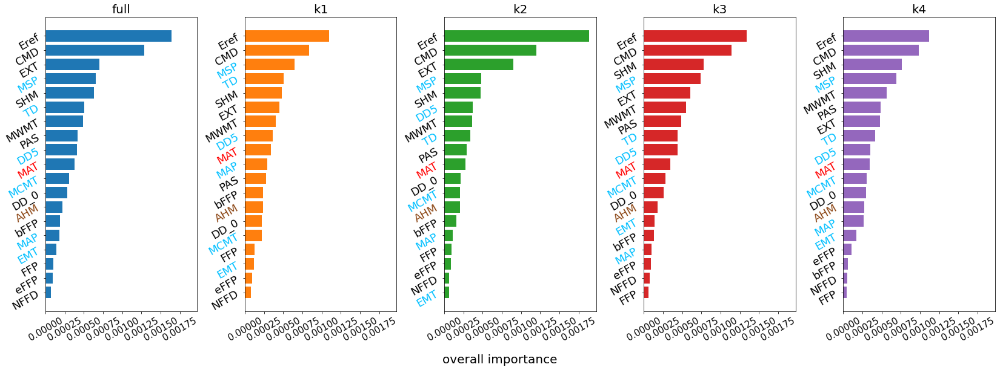

fdc wza random
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdc_wza_random_overall_importance_bargraph.pdf


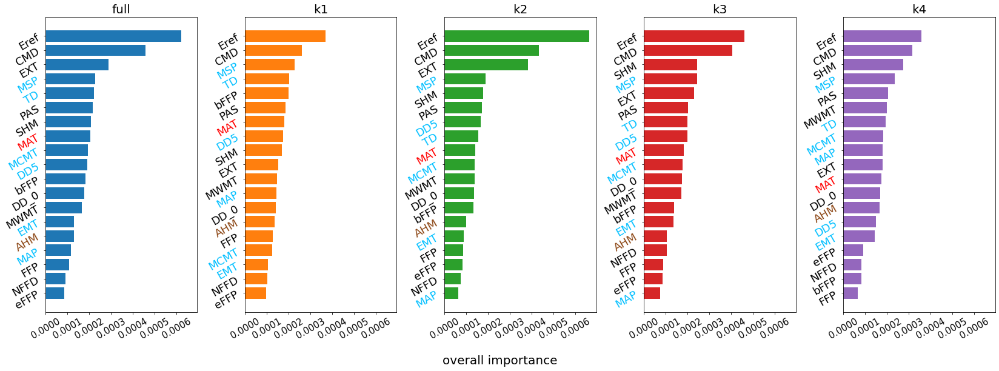

fdc wza real
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdc_wza_real_overall_importance_bargraph.pdf


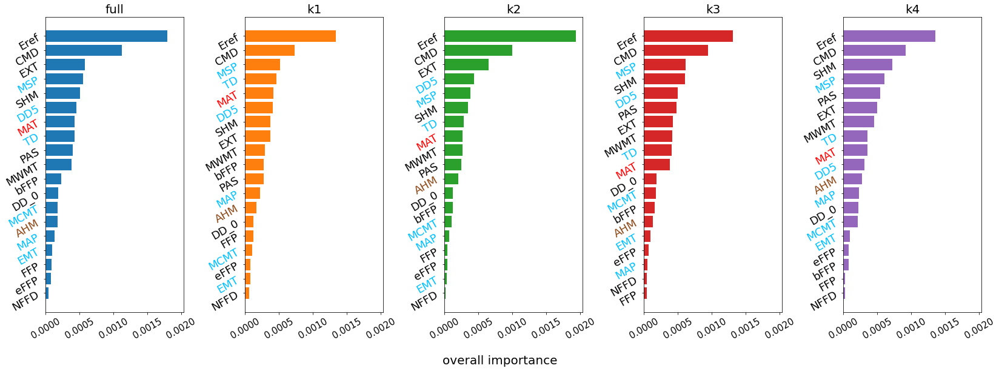

fdi baypass random
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdi_baypass_random_overall_importance_bargraph.pdf


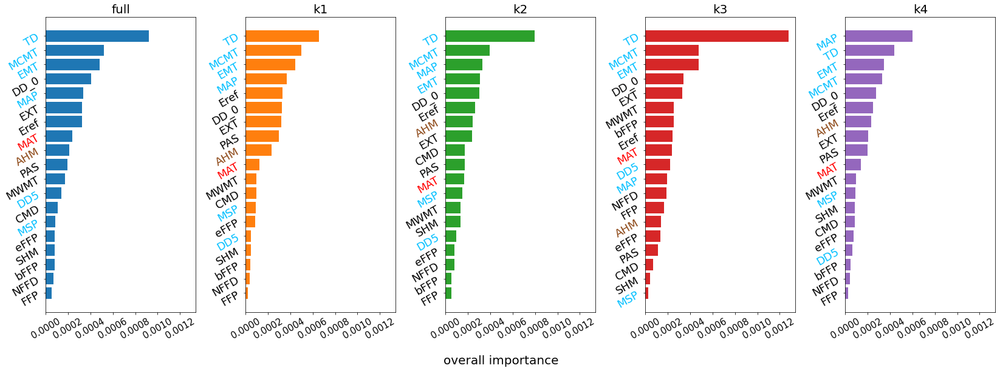

fdi baypass real
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdi_baypass_real_overall_importance_bargraph.pdf


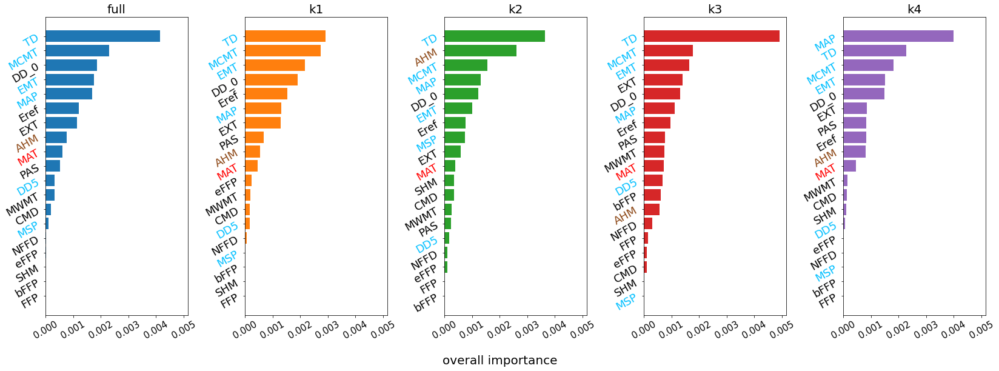

fdi wza random
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdi_wza_random_overall_importance_bargraph.pdf


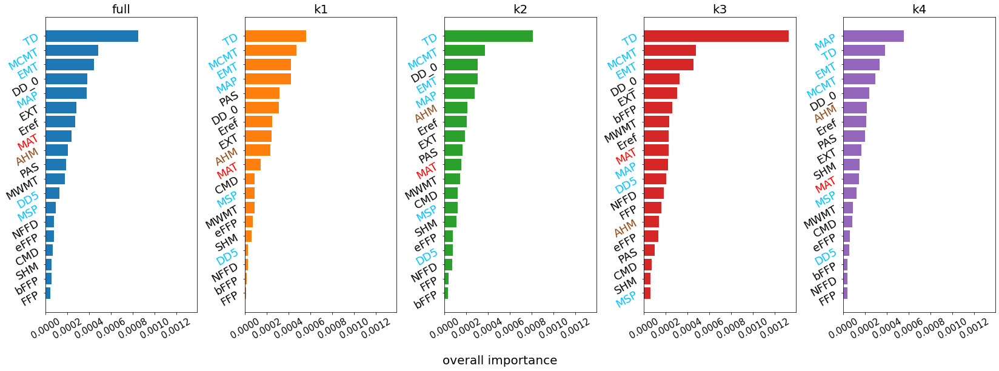

fdi wza real
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/fdi_wza_real_overall_importance_bargraph.pdf


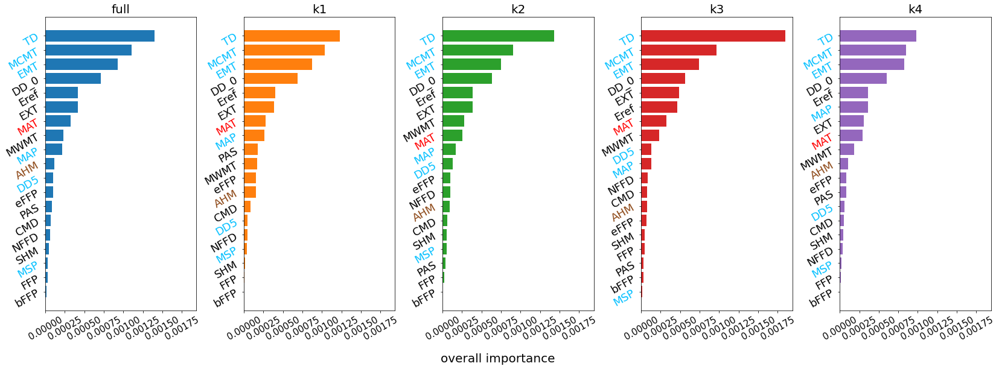

jp baypass random
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/jp_baypass_random_overall_importance_bargraph.pdf


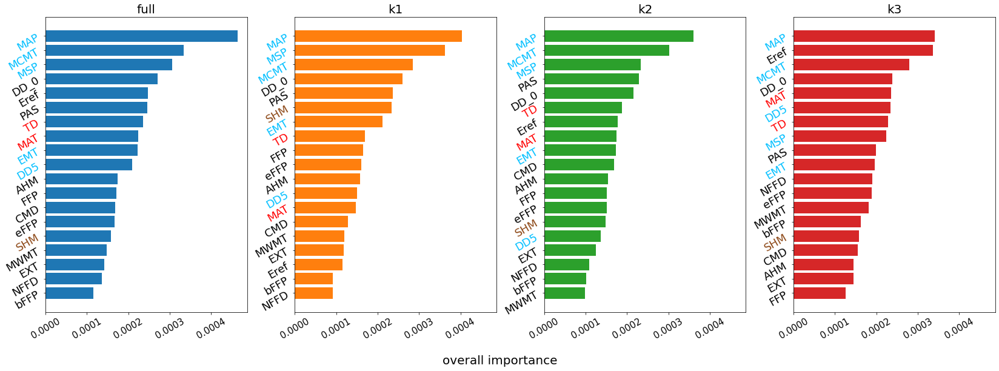

jp baypass real
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/jp_baypass_real_overall_importance_bargraph.pdf


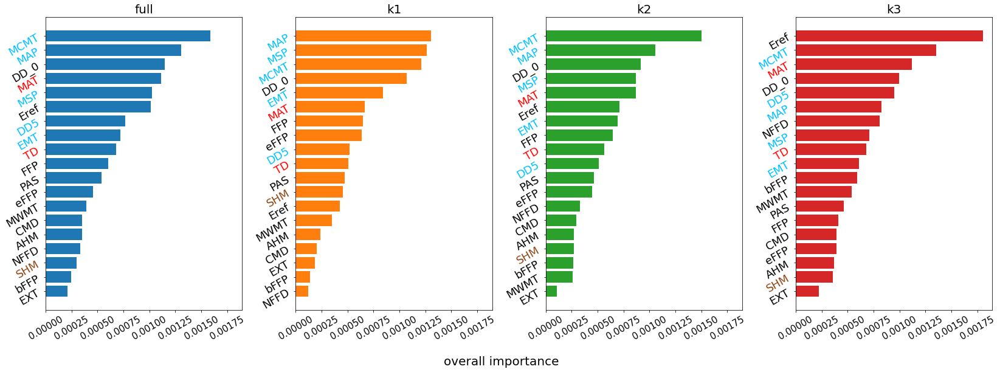

jp wza random
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/jp_wza_random_overall_importance_bargraph.pdf


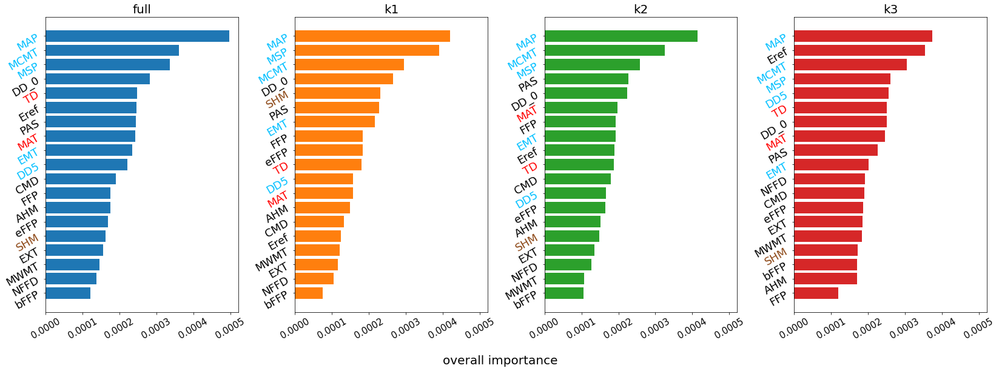

jp wza real
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/importance/jp_wza_real_overall_importance_bargraph.pdf


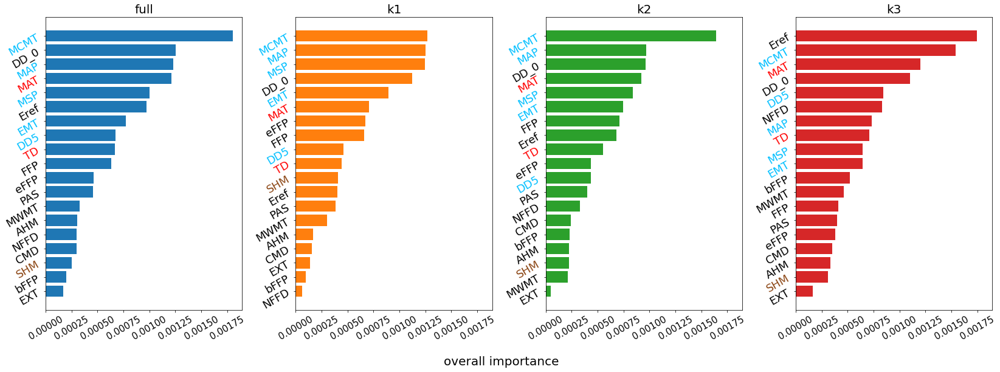

In [41]:
wrap_create(importance='overall_importance')

In [42]:
importances['fdc']['baypass']['real']['full']['weighted_importance']#.rank()

AHM     0.008705
bFFP    0.006799
CMD     0.042590
DD_0    0.009096
DD5     0.014630
eFFP    0.004005
EMT     0.005632
Eref    0.053520
EXT     0.023616
FFP     0.004320
MAP     0.007462
MAT     0.012503
MCMT    0.009438
MSP     0.022679
MWMT    0.016826
NFFD    0.003598
PAS     0.013499
SHM     0.021866
TD      0.014769
Name: weighted_importance, dtype: float64

In [43]:
sorted([k.lower() for k in keys(cvar_colors['jp'])])

['ahm',
 'bffp',
 'cmd',
 'dd5',
 'dd_0',
 'effp',
 'elevation',
 'emt',
 'eref',
 'ext',
 'ffp',
 'map',
 'mat',
 'mcmt',
 'msp',
 'mwmt',
 'nffd',
 'pas',
 'shm',
 'td']

In [44]:
# notebook timer
formatclock(dt.now() - t1, exact=True)

'0-00:07:44'

[top](#home)